In [ ]:
pip install segmentation-models-pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 7.3 MB/s 
     |████████████████████████████████| 376 kB 37.1 MB/s 
     |████████████████████████████████| 58 kB 6.5 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12421 sha256=c38f5804be80f1f2ad0df0b4f6642fde6df69fe6c1b618ac1a3ebc6b03be5ff4
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=41d0974835f10787c74ff8b3e00e5eaea41f9f6c48a88efbc7135cfcf34b9eec
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


In [ ]:
import numpy as np
import torch
import pandas as pd
import torchvision
from torchvision import transforms
import torch.utils.data as data
import matplotlib.pyplot as plt
import torch.nn.functional as F
from sklearn.metrics import classification_report,f1_score,accuracy_score
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import os
import skimage
import skimage.io
from skimage.io import imread
from IPython.display import clear_output
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensor
from torch.utils.data import Dataset
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive/datasets
%ls

Mounted at /content/drive
/content/drive/MyDrive/datasets
CarDetection/            cats_vs_dogs_dataset/  data_for_hw5/
cats_and_dogs_filtered/  Covid_KT/


In [ ]:
%cd /content/drive/MyDrive/datasets
%ls

/content/drive/MyDrive/datasets
CarDetection/            cats_vs_dogs_dataset/  data_for_hw5/
cats_and_dogs_filtered/  Covid_KT/


In [ ]:
%cp -r /content/drive/MyDrive/datasets/Covid_KT/ /content/Covid_KT

In [ ]:
%cd /content/

/content


# Задача

<h4>Hеобходимо предсказать 10 масок с двумя классами: 0 — «матовое стекло», 1 — «уплотнения».</h4>

# Информация о данных

<h4>Непрозрачность матового стекла(ground glass). Непрозрачность по типу матового стекла (GGO) относится к мутным серым областям, которые могут отображаться на компьютерной томографии или рентгенограммах легких. Эти серые области указывают на повышенную плотность внутри легких. Термин происходит от технологии изготовления стекла, при которой поверхность стекла обрабатывается песком.Узелки чистой непрозрачности по типу матового стекла (GGO) являются важными индикаторами рака легких на КТ. Узелки GGO определяются как нечеткие области, которые не блокируют паренхиматозные структуры, сосуды и дыхательные пути под узлами.</h4>

<h4>Уплотнение в легких(consolidations) происходит, когда воздух, который обычно заполняет мелкие дыхательные пути в легких, заменяется чем-то другим. В зависимости от причины воздух может быть заменен жидкостью, такой как гной, кровь или вода. твердое вещество, такое как содержимое желудка или клетки.</h4>

# Обаботка данных

In [ ]:
images_medseg=np.load("/content/Covid_KT/images_medseg.npy").astype(np.float32)
images_radiopedia=np.load("/content/Covid_KT/images_radiopedia.npy").astype(np.float32)
masks_medseg=np.load("/content/Covid_KT/masks_medseg.npy").astype(np.int8)
masks_radiopedia=np.load("/content/Covid_KT/masks_radiopedia.npy").astype(np.int8)
test_images_medseg=np.load("/content/Covid_KT/test_images_medseg.npy").astype(np.float32)

## Plot images

In [ ]:
def plot_images(lungs,mask,num_img):
    plt.figure(figsize=(20,15))
    idxs=np.random.choice(len(lungs),num_img)
    for i,idx in enumerate(idxs):
        mask_img=np.transpose(mask[idx],(2,0,1))
        plt.subplot(num_img,4,i*4+1)
        plt.imshow(np.squeeze(lungs[idx]))
        plt.title('Легкие',fontsize=20)

        plt.subplot(num_img,4,i*4+2)
        plt.imshow(mask_img[0])
        plt.title('Матовое стекло',fontsize=20)

        plt.subplot(num_img,4,i*4+3)
        plt.imshow(mask_img[1])
        plt.title('Уплотнения',fontsize=20)

        plt.subplot(num_img,4,i*4+4)
        plt.imshow(mask_img[2])
        plt.title('Всё вместе',fontsize=20)

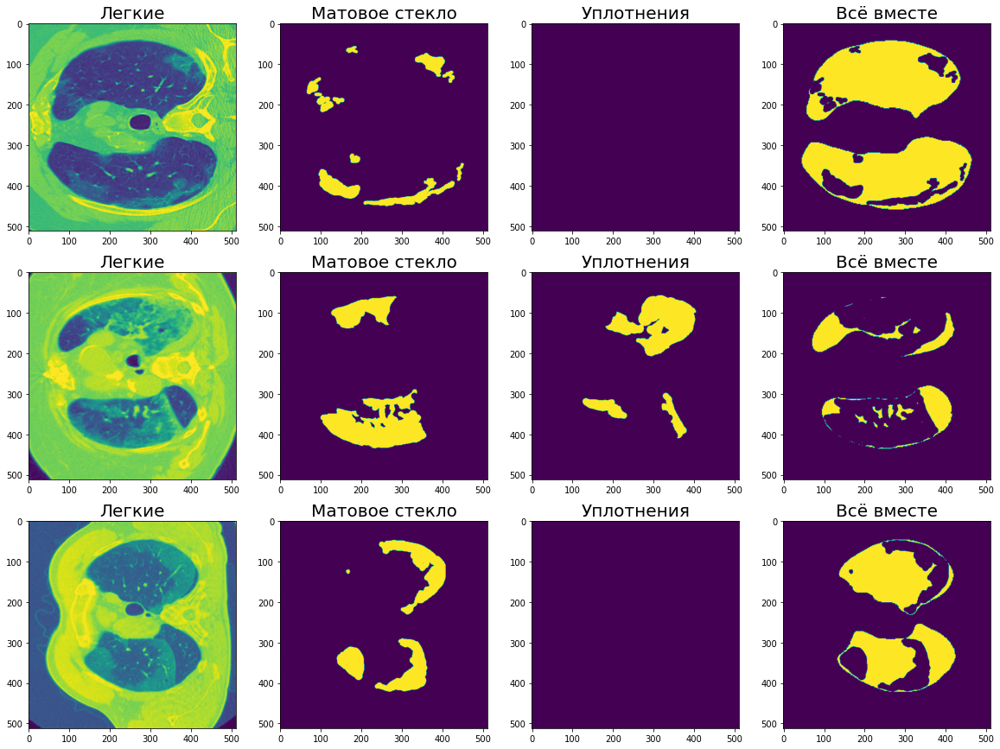

In [ ]:
plot_images(images_medseg,masks_medseg,3)

## Image Preprocessing

<h4>Входные данные нужно нормалзировать</h4>

In [ ]:
def calc_mean_std(data):
    data=np.squeeze(np.transpose(data,(0,3,1,2)))
    return np.mean(data),np.std(data)

In [ ]:
def preprocess_image(images,mean,std):
    data=np.squeeze(np.transpose(images,(0,3,1,2)))
    return (data-mean)/std

In [ ]:
mean,std=calc_mean_std(images_radiopedia)

In [ ]:
mean,std

(-450.68066, 495.4974)

In [ ]:
images_radiopedia_norm=preprocess_image(images_radiopedia,mean,std)
images_medseg_norm=preprocess_image(images_medseg,mean,std)
test_images_medseg_norm=preprocess_image(test_images_medseg,mean,std)

## Аугментация

<h4>Аугментацию в данном в данном случае мы используем потому что у нас очень маленький dataset, с помощью аугментаций мы его расширим. При обращение по одному и тому же индексу мы будем применять композицию трансформаций с разными вероятностями, тем самым реальных данных на входе в сеть будут поступать с определенными вероятностями </h4>

In [ ]:
transform_train=A.Compose([  
        A.Resize(290,290),
        A.RandomCrop(256,256),
        A.HorizontalFlip(p=0.5), 
        A.Rotate(limit=90,p=0.7),
        ToTensor() 
])

transform_val=A.Compose([  
        A.Resize(256,256),
        ToTensor() 
])


<h4>Как видно на картинках внизу аугментация работает</h4>

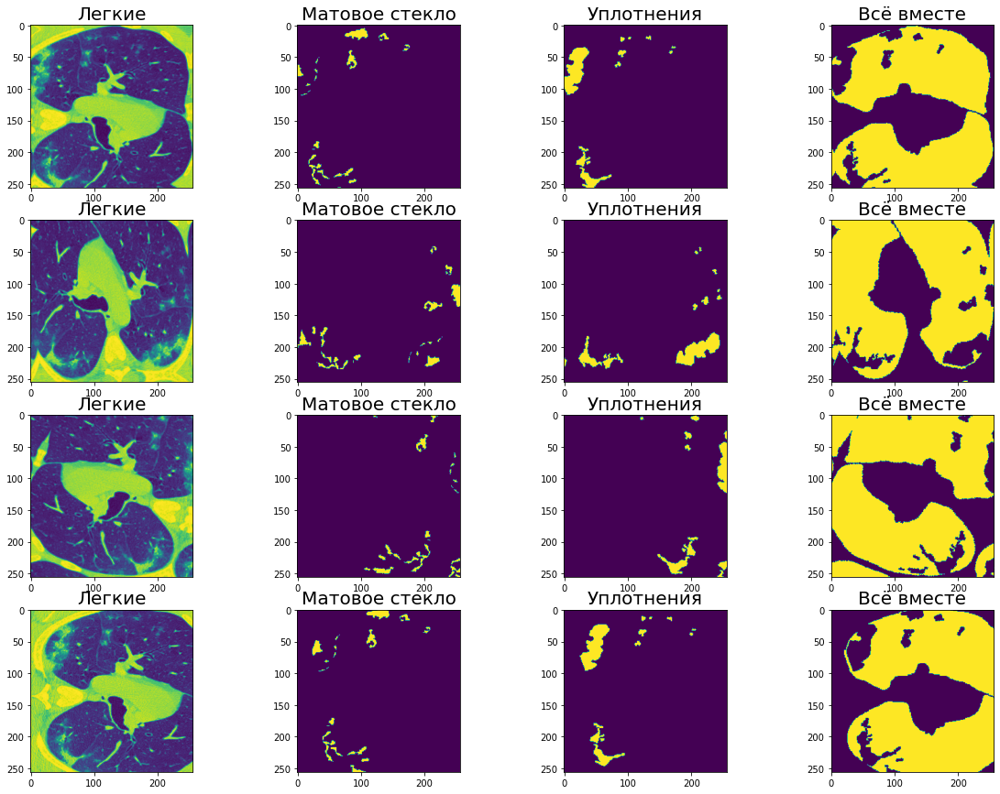

In [ ]:
plt.figure(figsize=(20,15))
for i in range(4):
    transformed=transform_train(image=images_medseg[10],mask=masks_medseg[10])
    mask_img=np.transpose(transformed['mask'][0],(2,0,1))

    plt.subplot(4,4,i*4+1)
    plt.imshow(np.squeeze(transformed['image']))
    plt.title('Легкие',fontsize=20)

    plt.subplot(4,4,i*4+2)
    plt.imshow(mask_img[0])
    plt.title('Матовое стекло',fontsize=20)

    plt.subplot(4,4,i*4+3)
    plt.imshow(mask_img[1])
    plt.title('Уплотнения',fontsize=20)

    plt.subplot(4,4,i*4+4)
    plt.imshow(mask_img[2])
    plt.title('Всё вместе',fontsize=20)

## Dataset

In [ ]:
class CustomDataset(Dataset):
    def __init__(self,X_data,Y_data,transform=None):
        self.X_data=np.expand_dims(X_data,axis=3)
        self.Y_data=Y_data
        self.transform=transform

    def __getitem__(self, index):
        x=self.X_data[index]
        y=self.Y_data[index]
        if self.transform:
            transformed=self.transform(image=x,mask=y)
        return transformed['image'],np.transpose(np.squeeze(transformed['mask']),(2,0,1))

    def __len__(self):
        return len(self.X_data)

## Объеденение датасетов

In [ ]:
data_x=np.concatenate((images_medseg_norm,images_radiopedia_norm),axis=0)
data_y=np.concatenate((masks_medseg,masks_radiopedia),axis=0)

In [ ]:
train_x=data_x[29:]
val_x=data_x[:29]

train_y=data_y[29:]
val_y=data_y[:29]

In [ ]:
train_x.shape,val_x.shape

((900, 512, 512), (29, 512, 512))

In [ ]:
train_y.shape,val_y.shape

((900, 512, 512, 4), (29, 512, 512, 4))

In [ ]:
train_data=CustomDataset(train_x,train_y,transform_train)
val_data=CustomDataset(val_x,val_y,transform_val)

In [ ]:
train_loader=torch.utils.data.DataLoader(train_data,batch_size=30,shuffle=True,num_workers=2,pin_memory=True)
val_loader=torch.utils.data.DataLoader(val_data,batch_size=len(val_data),shuffle=False,num_workers=2,pin_memory=True)

# Plot acc, error

<h4>Строит графики того как изменяется ошибка и точность на каждой эпохе</h4>

In [ ]:
def plot_acc_error(loss_error, IoU_glass_train_error,IoU_seals_train_error,errors_val,IoU_glass_test_1,IoU_seals_val_1):
  plt.figure(figsize=(20,10))

  plt.subplot(2,3,1)
  plt.plot(loss_error)
  plt.title("Train error")
  plt.xlabel("epoch")
  plt.ylabel("error")

  plt.subplot(2,3,2)
  plt.plot(IoU_glass_train_error)
  plt.title("IoU glass train error")
  plt.xlabel("epoch")
  plt.ylabel("error")

  plt.subplot(2,3,3)
  plt.plot(IoU_seals_train_error)
  plt.title("IoU seals train error")
  plt.xlabel("epoch")
  plt.ylabel("error")

  plt.subplot(2,3,4)
  plt.plot(errors_val)
  plt.title("Val error")
  plt.xlabel("epoch")
  plt.ylabel("error")

  plt.subplot(2,3,5)
  plt.plot(IoU_glass_test_1)
  plt.title("IoU glass val error")
  plt.xlabel("epoch")
  plt.ylabel("error")

  plt.subplot(2,3,6)
  plt.plot(IoU_seals_val_1)
  plt.title("IoU seals val error")
  plt.xlabel("epoch")
  plt.ylabel("error")

# Выбор порога

<h4>Эта функция строит графики IoU glass и IoU seal для разных порогов</h4>

In [ ]:
def plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds):
    plt.figure(figsize=(15,5))

    plt.subplot(1,2,1)
    plt.plot(thresholds,IoU_glass_val)
    plt.xlabel("Thresholds")
    plt.xlabel("IoU glass")

    plt.subplot(1,2,2)
    plt.plot(thresholds,IoU_seals_val)
    plt.xlabel("Thresholds")
    plt.xlabel("IoU seals")

<h4>Порог нужно настраивать для того, чтобы IoU был максимальным</h4>

# config_threshold

<h4>Эта функция расчитывает для модели и данных на val IoU glass и IoU seal для разных порогов</h4>

In [ ]:
def config_threshold(network,val_loader,thresholds):
    network.eval()
    IoU_glass_val=[]
    IoU_seals_val=[]
    best_iou=0
    best_threshold=0
    harmonic_mean=0
    for threshold in thresholds:
        with torch.no_grad():
            iou_metric_glass_val=0
            iou_metric_seal_val=0
            for x_val,y_true in val_loader:
                x_val=x_val.cuda()    
                y_predicted=network(x_val.detach())

                y_predicted=y_predicted.cuda()
                y_true=y_true.cuda()

                iou_metric_glass_val+=IoU(y_true[:,0].detach(),y_predicted[:,0].detach(),threshold).mean().item()
                iou_metric_seal_val+=IoU(y_true[:,1].detach(),y_predicted[:,1].detach(),threshold).mean().item()

            IoU_glass_val.append(iou_metric_glass_val/len(val_loader))
            IoU_seals_val.append(iou_metric_seal_val/len(val_loader))
            harmonic_mean=2*(iou_metric_glass_val/len(val_loader)*iou_metric_seal_val/len(val_loader))/(iou_metric_glass_val/len(val_loader)*iou_metric_seal_val+len(val_loader))
            if best_iou<harmonic_mean:
                best_iou=harmonic_mean
                best_threshold=threshold

    return IoU_glass_val,IoU_seals_val,best_threshold

# Plot x-ray with mask

<h4>Функция отображает снимок, реальную маску и предсказанную</h4>

In [ ]:
def plot_mask(x_ray,mask_true,mask_predicted,threshold):
    plt.figure(figsize=(15,15))
    mask_predicted=mask_predicted.to('cpu')
    plt.subplot(1,3,1)
    plt.imshow(x_ray)
    plt.title("X-ray")

    plt.subplot(1,3,2)
    plt.imshow(mask_true)
    plt.title("True")

    plt.subplot(1,3,3)
    mask_predicted=mask_predicted>threshold
    mask_predicted=mask_predicted.byte()
    plt.imshow(mask_predicted)
    plt.title("Predicted")

# predict_mask

In [ ]:
def predict_mask(network,img):
    network.eval()
    if len(img)==1:
        img=torch.unsqueeze(img,axis=0)
    img=img.cuda()
    mask_pred=network(img)

    return mask_pred

# IoU

<h4>Intersection over union - метрика которая показывает качество модели, делит пересечение масок на их объединение.</h4>

In [ ]:
def IoU(mask_true,mask_pred,threshold):
    with torch.no_grad():
        mask_true=mask_true.to('cpu')
        mask_pred=mask_pred.to('cpu')

        if mask_true.dim()==2:
            mask_true=torch.unsqueeze(mask_true,0)
        if mask_pred.dim()==2:
            mask_pred=torch.unsqueeze(mask_pred,0)
        epsilon=1e-8

        mask_pred=mask_pred>threshold

        mask_pred=mask_pred.byte()
        mask_true=mask_true.byte()

        mask_union=(mask_pred|mask_true).float().sum((1,2))
        mask_intersaption=(mask_pred&mask_true).float().sum((1,2))

        iou=(mask_intersaption+epsilon)/(mask_union+epsilon)

    return iou

# Train function

In [ ]:
def train_net(network,train_loader,val_loader,learning_rate=0.001,epochs=3,loaded_optimizer=None,threshold=1,network_name=None):
    optimizer=None
    if loaded_optimizer:
      optimizer=loaded_optimizer
    else:
      optimizer=torch.optim.AdamW(network.parameters(),lr=learning_rate,weight_decay=1e-4) # Optimizer
    
    loss_fn=torch.nn.CrossEntropyLoss() # Функция стоимости
    best_error=999
    iou_metric_glass=0
    iou_metric_seal=0
    errors=[] 
    errors_val=[]
    IoU_glass_1=[]
    IoU_seals_1=[]

    IoU_glass_test_1=[]
    IoU_seals_val_1=[]

    network.train() # переводим сеть в состояние обучения
    
    for epoch in tqdm(range(epochs)):
        error=0
        iou_metric_glass=0
        iou_metric_seal=0
        for x_batch,y_batch in tqdm(train_loader):

            x_batch=x_batch.cuda() # передаем данные на куду
            y_batch=y_batch.cuda() 

            optimizer.zero_grad()
 
            y_pred=network(x_batch)
  
            loss=loss_fn(y_pred,y_batch)

            error+=loss.item()

            loss.backward()

            optimizer.step()

            iou_metric_glass+=IoU(y_batch[:,0].detach(),y_pred[:,0].detach(),threshold).mean().item() # IoU на маске матовое стекло с порогом 1
            iou_metric_seal+=IoU(y_batch[:,1].detach(),y_pred[:,1].detach(),threshold).mean().item() # IoU на маске уплотнение с порогом 1

        errors.append(error/len(train_loader))
        IoU_glass_1.append(iou_metric_glass/len(train_loader))
        IoU_seals_1.append(iou_metric_seal/len(train_loader))
        print(f"Epoch = {epoch}")
        print(f"Train error = {error/len(train_loader)}, IoU glass = {iou_metric_glass/len(train_loader)}, IoU seals = {iou_metric_seal/len(train_loader)}")
        network.eval() #переводим сеть в состояние оценивание: исключаем слои, которые используются только train
        with torch.no_grad(): # временно устанавливает флаги requires_grad=False
            error_val=0
            iou_metric_glass_val=0
            iou_metric_seal_val=0
            for x_val,y_true in val_loader:
                x_val=x_val.cuda()    
                y_predicted=network(x_val.detach())

                y_predicted=y_predicted.cuda()
                y_true=y_true.cuda()

                loss_val=loss_fn(y_predicted.detach(),y_true.detach())
                error_val+=loss_val.item()

                iou_metric_glass_val+=IoU(y_true[:,0].detach(),y_predicted[:,0].detach(),threshold).mean().item() # IoU на маске матовое стекло с порогом 1
                iou_metric_seal_val+=IoU(y_true[:,1].detach(),y_predicted[:,1].detach(),threshold).mean().item() # IoU на маске уплотнение с порогом 1

            IoU_glass_test_1.append(iou_metric_glass_val/len(val_loader))
            IoU_seals_val_1.append(iou_metric_seal_val/len(val_loader))
            errors_val.append(error_val/len(val_loader))
            print(f"Val error = {error_val/len(val_loader)}, IoU glass = {iou_metric_glass_val/len(val_loader)}, IoU seals = {iou_metric_seal_val/len(val_loader)}")

            if best_error>error_val/len(val_loader):
                print(f'Save best model with val error {error_val/len(val_loader)}')
                state = {
                        'state_dict': network.state_dict(),
                        'optimizer' : optimizer.state_dict()}
                if network_name:
                    torch.save(state, f"/content/drive/MyDrive/ML_models/hw6/{network_name}_best_model.pt") #Сохраняем наилучшую модель
                else:
                    torch.save(state, f"/content/drive/MyDrive/ML_models/hw6/best_model.pt")
                best_error=error_val/len(val_loader)
            else:
                print(f"Don't save model. Val error is {error_val/len(val_loader)}")
            
        network.train()

    return network,errors,IoU_glass_1,IoU_seals_1,errors_val,IoU_glass_test_1,IoU_seals_val_1

# Custome net for segmentation

In [ ]:
class ConvBlock(torch.nn.Module):
  def __init__(self,in_c,out_c,**kwargs):
    super(ConvBlock,self).__init__()
    self.conv=torch.nn.Conv2d(in_c,out_c,**kwargs)
    self.bn=torch.nn.BatchNorm2d(out_c)
    self.relu=torch.nn.ReLU()
  def forward(self,x):
    return self.relu(self.bn(self.conv(x)))

<h4>Обычный сверточный слой + бэнч норм +relu</h4>

In [ ]:
class ResBlock(torch.nn.Module):
  def __init__(self,in_c,out_c,kernel=3,stride=1,padding=0):
    super(ResBlock,self).__init__()
    self.conv1=ConvBlock(in_c,out_c,kernel_size=kernel,stride=stride,padding=padding)
    self.conv2=ConvBlock(out_c,out_c,kernel_size=kernel,stride=stride,padding=padding)
  def forward(self,x):
    out_1=self.conv1(x)
    x=self.conv2(out_1)
    x_out=x+out_1
    return x_out

<h4>ResBlock в стиле ReLU before addition<h4>

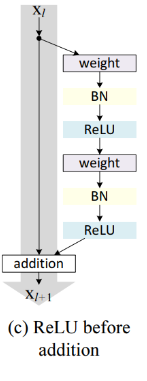

In [ ]:
class InceptionBlock(torch.nn.Module):

      def __init__(self,
                   in_c,
                   out_1x1,
                   red_3x3,
                   out_3x3,
                   red_5x5,
                   out_5x5,
                   out_max_pool
                   ):
        super(InceptionBlock,self).__init__()
        self.branch1=ConvBlock(in_c,out_1x1,kernel_size=1)
        self.branch2=torch.nn.Sequential(
            ConvBlock(in_c,red_3x3,kernel_size=1),
            ConvBlock(red_3x3,out_3x3,kernel_size=3,padding=1)
        )
        self.branch3=torch.nn.Sequential(
            ConvBlock(in_c,red_5x5,kernel_size=1),
            ConvBlock(red_5x5,out_5x5,kernel_size=5,padding=2)
        )
        self.branch4=torch.nn.Sequential(
            torch.nn.MaxPool2d(kernel_size=3,stride=1,padding=1),
            ConvBlock(in_c,out_max_pool,kernel_size=1)
        )
      
      def forward(self,x):
        branches=(self.branch1,self.branch2,self.branch3,self.branch4)
        return torch.cat([branch(x) for branch in branches],1)

<h4>Простой Inseption block</h4>

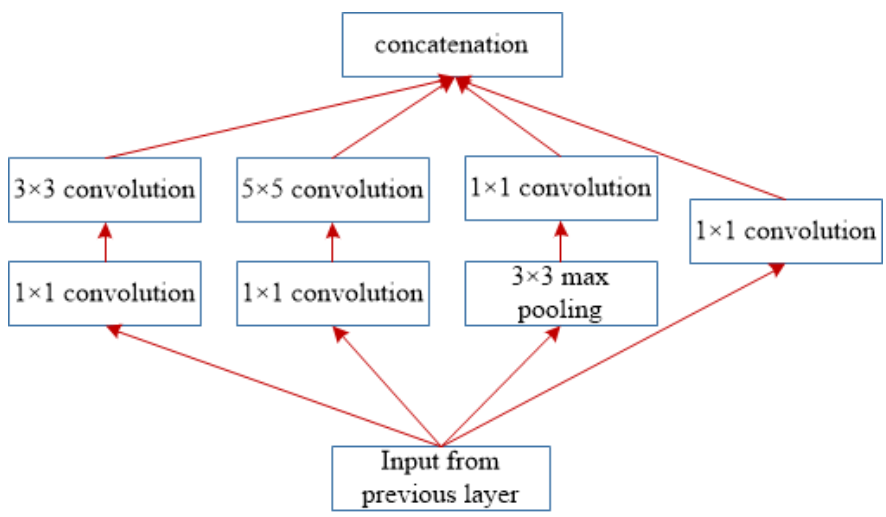

<h4>В качестве архитектуры для сегментации выбрана U-net.</h4>

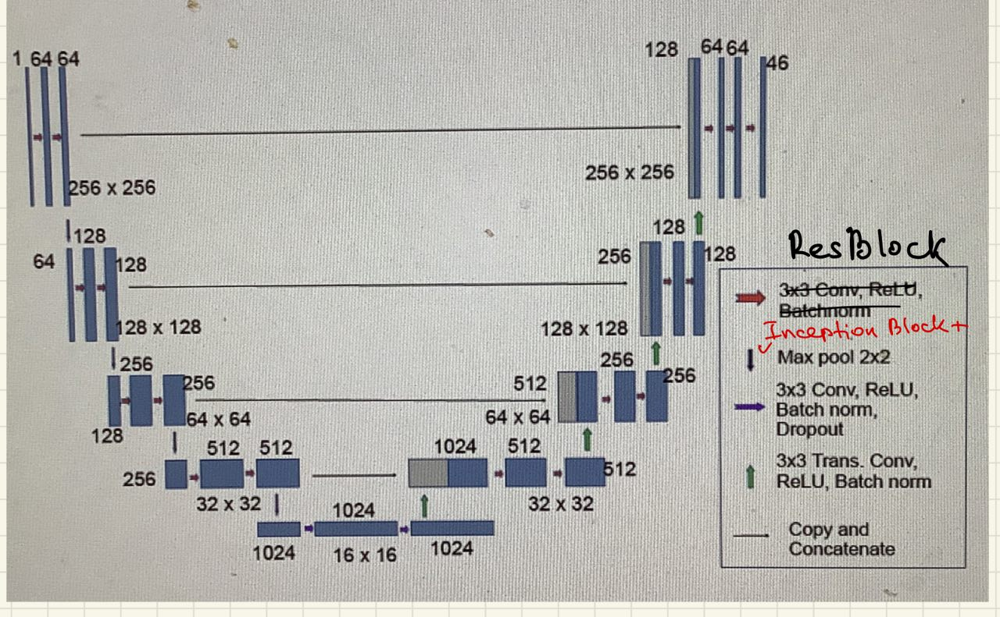

<h4>На каждом уровне encoder и decoder будет применены 3 resBlock на каждом переходе с верхнего на нижний уровень применяется Inseption block+max pool(Во время тренировки сети оказалась, что она слишком больная и не хе хватало памяти графического процессора, пришлось избавиться от Inception block и от одного resBlock на каждом уровне)</h4>

In [ ]:
class Custome_Net(torch.nn.Module):
    def __init__(self):
        super(Custome_Net,self).__init__()
        self.resblock_11=ResBlock(1,64,kernel=3,padding=1)
        self.resblock_12=ResBlock(64,64,kernel=3,padding=1)
        # self.resblock_13=ResBlock(64,64,kernel=3,padding=1)

        # self.inception_block1=InceptionBlock(64,8,8,32,8,16,8)
        self.max_pool1=torch.nn.MaxPool2d(2,2) #256->128

        self.resblock_21=ResBlock(64,128,kernel=3,padding=1)
        self.resblock_22=ResBlock(128,128,kernel=3,padding=1)
        # self.resblock_23=ResBlock(128,128,kernel=3,padding=1)

        # self.inception_block2=InceptionBlock(128,16,16,64,16,32,16)
        self.max_pool2=torch.nn.MaxPool2d(2,2) #128->64

        self.resblock_31=ResBlock(128,256,kernel=3,padding=1)
        self.resblock_32=ResBlock(256,256,kernel=3,padding=1)
        # self.resblock_33=ResBlock(256,256,kernel=3,padding=1)

        # self.inception_block3=InceptionBlock(256,32,32,128,32,64,32)
        self.max_pool3=torch.nn.MaxPool2d(2,2) #64->32

        self.resblock_41=ResBlock(256,512,kernel=3,padding=1)
        self.resblock_42=ResBlock(512,512,kernel=3,padding=1)
        # self.resblock_43=ResBlock(512,512,kernel=3,padding=1)

        # self.inception_block4=InceptionBlock(512,64,64,256,64,128,64)
        self.max_pool4=torch.nn.MaxPool2d(2,2) #32->16

        self.bottleneck_conv=ConvBlock(512,512,kernel_size=1)

        self.up_conv1=torch.nn.ConvTranspose2d(512,256,kernel_size=3,padding=1,stride=2) #16->32
        self.up_conv2=torch.nn.ConvTranspose2d(768,128,kernel_size=3,padding=1,stride=2) #32->64
        self.up_conv3=torch.nn.ConvTranspose2d(384,64,kernel_size=3,padding=1,stride=2) #64->128
        self.up_conv4=torch.nn.ConvTranspose2d(192,1,kernel_size=3,padding=1,stride=2) #128->256

        # self.conv=torch.nn.Conv2d(9,1,3,1,1)
        self.conv=ConvBlock(65,4,kernel_size=3,stride=1,padding=1)
        self.relu=torch.nn.ReLU()
    def forward(self,x):
        #encoder

        e1=self.resblock_11(x)
        e1=self.resblock_12(e1)
        # e1=self.resblock_13(e1)
        # e1_inc_max_pool=self.max_pool1(self.inception_block1(e1))
        e1_inc_max_pool=self.max_pool1(e1)
        e2=self.resblock_21(e1_inc_max_pool)
        e2=self.resblock_22(e2)
        # e2=self.resblock_23(e2)
        # e2_inc_max_pool=self.max_pool2(self.inception_block2(e2))
        e2_inc_max_pool=self.max_pool2(e2)

        e3=self.resblock_31(e2_inc_max_pool)
        e3=self.resblock_32(e3)
        # e3=self.resblock_33(e3)
        # e3_inc_max_pool=self.max_pool3(self.inception_block3(e3))
        e3_inc_max_pool=self.max_pool3(e3)

        e4=self.resblock_41(e3_inc_max_pool)
        e4=self.resblock_42(e4)
        # e4=self.resblock_43(e4)
        # e4_inc_max_pool=self.max_pool4(self.inception_block4(e4))
        e4_inc_max_pool=self.max_pool4(e4)
        # e1=self.enc_conv1(x)
        # e1_max_pool=self.max_pool1(e1)

        # e2=self.enc_conv2(e1_max_pool)
        # e2_max_pool=self.max_pool2(e2)

        # e3=self.enc_conv3(e2_max_pool)
        # e3_max_pool=self.max_pool3(e3)

        # e4=self.enc_conv4(e3_max_pool)
        # e4_max_pool=self.max_pool4(e4)

        x=self.bottleneck_conv(e4_inc_max_pool)
        
        #decoder
        d1=self.relu(self.up_conv1(x,output_size=(32, 32)))
        d1=torch.cat((d1,e4),axis=1)

        d2=self.relu(self.up_conv2(d1,output_size=(64, 64)))
        d2=torch.cat([d2,e3],axis=1)


        d3=self.relu(self.up_conv3(d2,output_size=(128, 128)))

        d3=torch.cat([d3,e2],axis=1)

        d4=self.relu(self.up_conv4(d3,output_size=(256, 256)))
        d4=torch.cat([d4,e1],axis=1)
        return self.conv(d4)

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

168

In [ ]:
my_net=Custome_Net().cuda()

## Обучение

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(my_net,train_loader,val_loader,epochs=15,threshold=0.5,network_name="my_model")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 1.0992400308450063, IoU glass = 0.05081265823294719, IoU seals = 0.00036848970879413737
Val error = 1.1195290088653564, IoU glass = 0.1882726401090622, IoU seals = 0.02874918095767498
Save best model with val error 1.1195290088653564


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.9489252746105195, IoU glass = 0.09335556589066982, IoU seals = 0.007849228141758783
Val error = 1.0086181163787842, IoU glass = 0.2505074143409729, IoU seals = 0.0003678046341519803
Save best model with val error 1.0086181163787842


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.8826988995075226, IoU glass = 0.1250097253670295, IoU seals = 0.05001508311276635
Val error = 0.9541944861412048, IoU glass = 0.2385159730911255, IoU seals = 0.0009113367414101958
Save best model with val error 0.9541944861412048


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.8394099096457164, IoU glass = 0.15919229437907537, IoU seals = 0.08556768453631731
Val error = 0.9238823652267456, IoU glass = 0.2965860664844513, IoU seals = 0.2068965584039688
Save best model with val error 0.9238823652267456


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.817141999801, IoU glass = 0.17133225897947948, IoU seals = 0.1500195613957495
Val error = 0.8863608241081238, IoU glass = 0.39024028182029724, IoU seals = 0.011392097920179367
Save best model with val error 0.8863608241081238


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.787589023510615, IoU glass = 0.21249353463451068, IoU seals = 0.23333418952922028
Val error = 0.8644328713417053, IoU glass = 0.38699379563331604, IoU seals = 0.2068965584039688
Save best model with val error 0.8644328713417053


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.7628395279248555, IoU glass = 0.2187832882006963, IoU seals = 0.5411114758501451
Val error = 0.8643819689750671, IoU glass = 0.3974054455757141, IoU seals = 0.2068965584039688
Save best model with val error 0.8643819689750671


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.7393649240334829, IoU glass = 0.2550530495742957, IoU seals = 0.5766672395169735
Val error = 0.9063424468040466, IoU glass = 0.38149493932724, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.9063424468040466


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.7163958569367727, IoU glass = 0.2562176786363125, IoU seals = 0.6700000057617823
Val error = 0.7675693035125732, IoU glass = 0.38065105676651, IoU seals = 0.2068965584039688
Save best model with val error 0.7675693035125732


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.6953669627507527, IoU glass = 0.2554825176795324, IoU seals = 0.6355555579066277
Val error = 0.8769490718841553, IoU glass = 0.38995715975761414, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.8769490718841553


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.670730878909429, IoU glass = 0.2578361575802167, IoU seals = 0.6822222252686818
Val error = 0.773476243019104, IoU glass = 0.40096986293792725, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.773476243019104


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.6502667109171549, IoU glass = 0.27248288864890735, IoU seals = 0.6822222262620926
Val error = 0.737592875957489, IoU glass = 0.402940034866333, IoU seals = 0.2068965584039688
Save best model with val error 0.737592875957489


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.632779860496521, IoU glass = 0.26532163272301357, IoU seals = 0.6822222212950388
Val error = 0.7212320566177368, IoU glass = 0.40788257122039795, IoU seals = 0.2068965584039688
Save best model with val error 0.7212320566177368


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.6210096716880799, IoU glass = 0.2624478906393051, IoU seals = 0.6277777880470623
Val error = 0.650071382522583, IoU glass = 0.4117184281349182, IoU seals = 0.2068965584039688
Save best model with val error 0.650071382522583


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.6005356272061666, IoU glass = 0.2760483173032602, IoU seals = 0.6833333373069763
Val error = 0.6820128560066223, IoU glass = 0.4050476551055908, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.6820128560066223


## Результаты модели

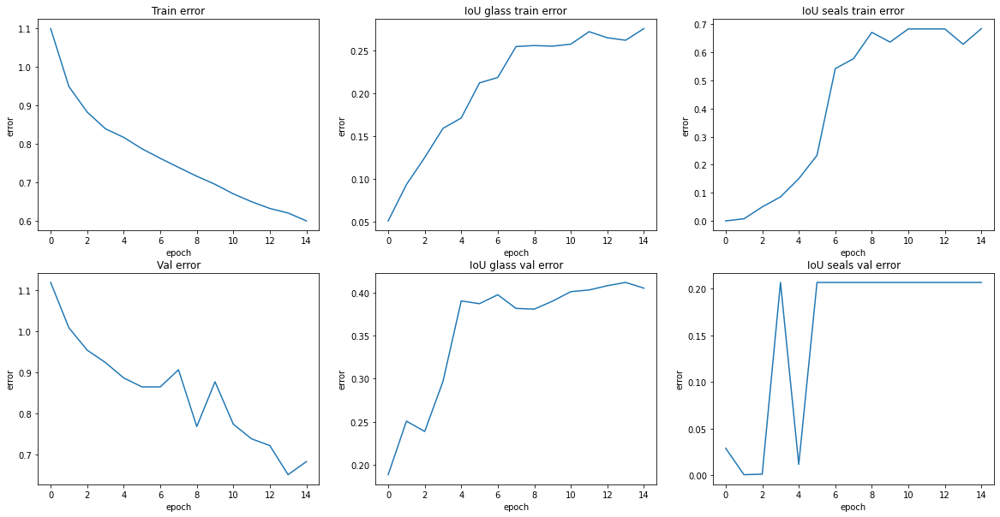

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals увеличивается только train, val колеблится и выходит на плато. Так же моя сеть идет в нужном направлении, но очень медленно, лучше использовать предобученные модели.</h4>

## Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/my_model_best_model.pt")

In [ ]:
best_simple_model=Custome_Net().cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

## Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

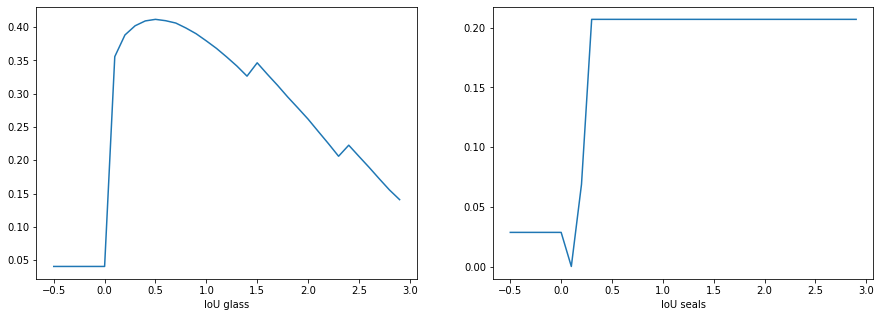

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

0.4999999999999998

<h4>Лучшие IoU c 1.3 порогом</h4>

## Plot x-ray with mask

In [ ]:
k=10
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.2377])


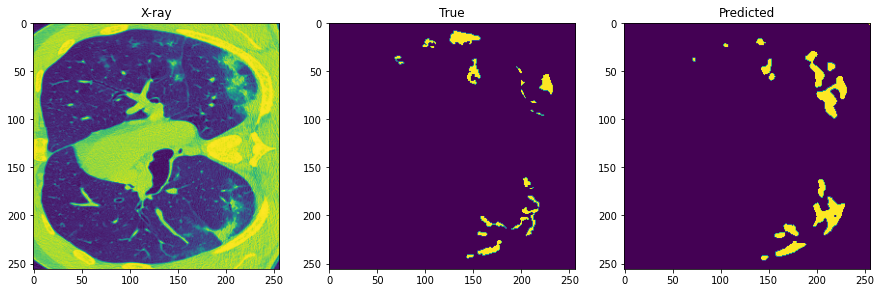

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.2235])


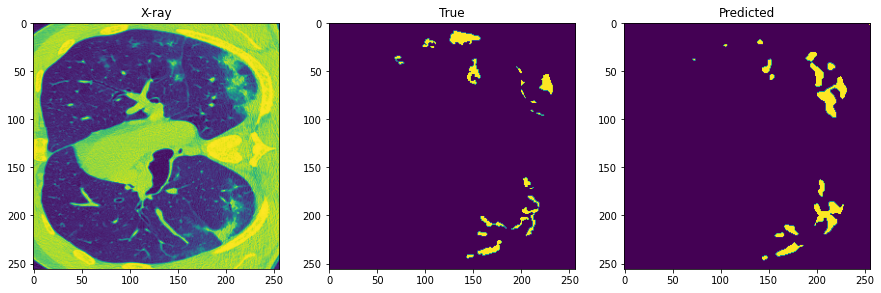

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами самый в среднем лучший порог лучше подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.4267])


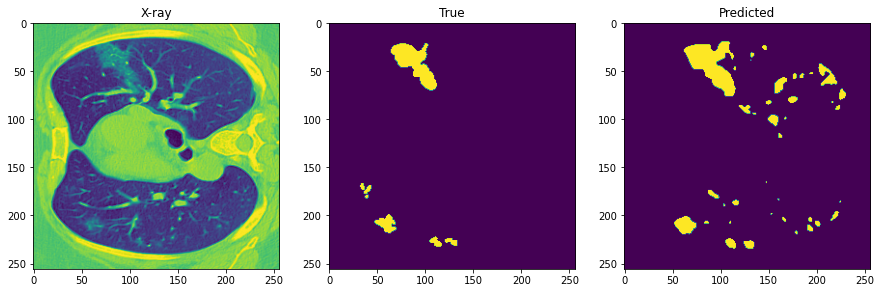

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.5359])


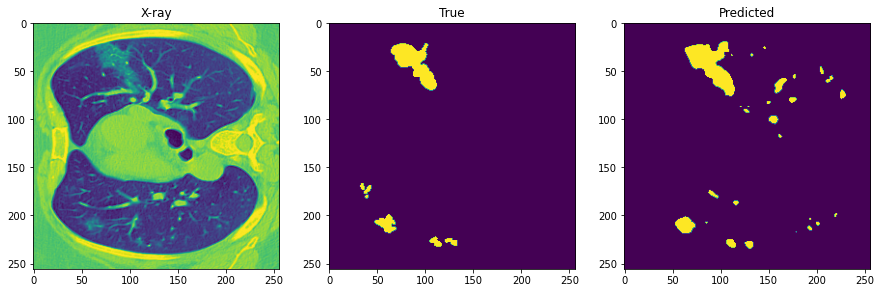

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат. В данном случае самый в среднем лучший порог хуже подобранного</h4> 

## Вывод

<h4>Моя модель для сегментации показала неплохие результаты, но лучше использовать предобученные, так как они быстрее получают хорошие результаты</h4>

# Предобученная модель

## Unet

## Architecture

<p><h3>Идея:</h3></p>
<h4>
Мы передаем карты активации на encoder уровнях и cancat их с картами активациями на decoder, тем самым передаем информацию на кодировании декодировщику. Также в качесте энкодеров используются resnets, то есть для того чтобы сделать сеть больше добавляем res блоки со skip-connection.
</h4>

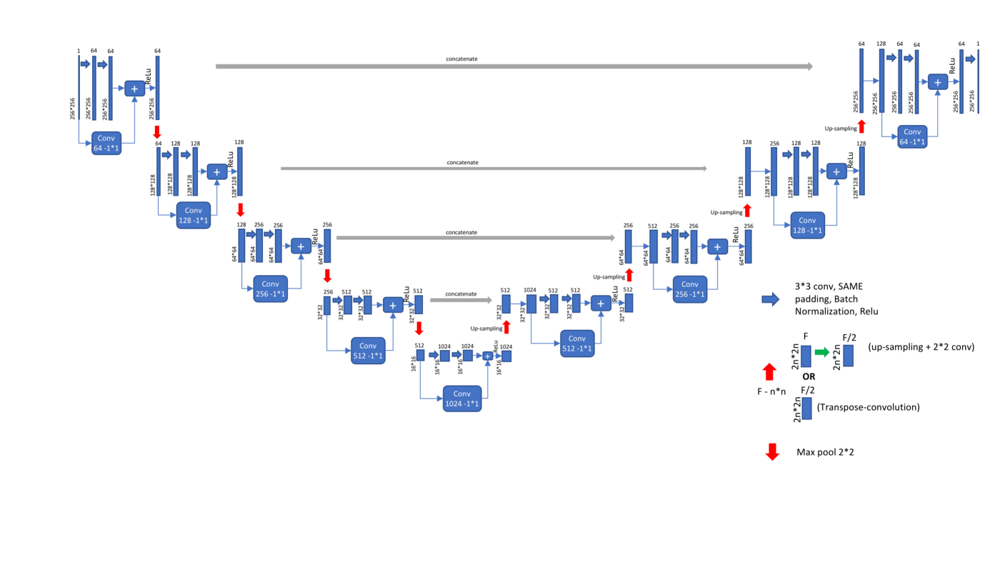

### Encoder resnet101

<h4>В качестве encoder выбрана resnet101 глубиной 5 и с весами imagenet. Это достаточно большая модель, она имеет 42M весов в будущем она будет использоваться, как модель учитель при дистиляции </h4>

In [ ]:
pretrained_model=smp.Unet(encoder_name="resnet101",encoder_depth=5,encoder_weights='imagenet',
                          decoder_channels=(256, 128, 64, 32, 16),decoder_use_batchnorm=True,
                          in_channels=1,classes=4,activation=None
                          ).cuda()

#### Обучение

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(pretrained_model,train_loader,val_loader,epochs=15,threshold=0.5,network_name="resnet101")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 0.6175114333629608, IoU glass = 0.15437896062309545, IoU seals = 0.37281061775889646
Val error = 37.160919189453125, IoU glass = 0.0569743774831295, IoU seals = 0.2068965584039688
Save best model with val error 37.160919189453125


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.17484255904952686, IoU glass = 0.24437850539882977, IoU seals = 0.6788888951142629
Val error = 0.3241584897041321, IoU glass = 0.28124290704727173, IoU seals = 0.2068965584039688
Save best model with val error 0.3241584897041321


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.10576676751176516, IoU glass = 0.2653390258550644, IoU seals = 0.6777777810891469
Val error = 0.27159208059310913, IoU glass = 0.28363102674484253, IoU seals = 0.2068965584039688
Save best model with val error 0.27159208059310913


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.09739626422524453, IoU glass = 0.2688435601691405, IoU seals = 0.6777803897857666
Val error = 0.28994718194007874, IoU glass = 0.34204763174057007, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.28994718194007874


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.08029005924860637, IoU glass = 0.31169751435518267, IoU seals = 0.6733673373858134
Val error = 0.2174450159072876, IoU glass = 0.3375716507434845, IoU seals = 0.20692630112171173
Save best model with val error 0.2174450159072876


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.07127548232674599, IoU glass = 0.28712223619222643, IoU seals = 0.644600514570872
Val error = 0.3748887777328491, IoU glass = 0.2500494718551636, IoU seals = 0.2575448751449585
Don't save model. Val error is 0.3748887777328491


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.0653462741523981, IoU glass = 0.32356278946002326, IoU seals = 0.6580350528160731
Val error = 0.20183277130126953, IoU glass = 0.24658682942390442, IoU seals = 0.1582936942577362
Save best model with val error 0.20183277130126953


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.06648344943920771, IoU glass = 0.3294069816668828, IoU seals = 0.6484810173511505
Val error = 0.2431752234697342, IoU glass = 0.3988648056983948, IoU seals = 0.22488079965114594
Don't save model. Val error is 0.2431752234697342


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.06213270525137583, IoU glass = 0.31816096156835555, IoU seals = 0.6416770199934642
Val error = 0.20684640109539032, IoU glass = 0.3474150002002716, IoU seals = 0.19676151871681213
Don't save model. Val error is 0.20684640109539032


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.05749357131620248, IoU glass = 0.33062402382493017, IoU seals = 0.6685040881236394
Val error = 0.18976931273937225, IoU glass = 0.284897118806839, IoU seals = 0.20388853549957275
Save best model with val error 0.18976931273937225


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.05133611671626568, IoU glass = 0.33123654971520106, IoU seals = 0.6767813464005789
Val error = 0.1691669523715973, IoU glass = 0.26162242889404297, IoU seals = 0.22265338897705078
Save best model with val error 0.1691669523715973


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.0552075669169426, IoU glass = 0.3303828845421473, IoU seals = 0.6739296088616054
Val error = 0.21036216616630554, IoU glass = 0.4312169551849365, IoU seals = 0.2248460203409195
Don't save model. Val error is 0.21036216616630554


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.0512851994484663, IoU glass = 0.3093006933728854, IoU seals = 0.6836864193280537
Val error = 0.18532106280326843, IoU glass = 0.23608814179897308, IoU seals = 0.19691428542137146
Don't save model. Val error is 0.18532106280326843


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.05113926740984122, IoU glass = 0.33141760726769764, IoU seals = 0.6537915150324504
Val error = 0.17370523512363434, IoU glass = 0.214882031083107, IoU seals = 0.2232457846403122
Don't save model. Val error is 0.17370523512363434


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.05046885460615158, IoU glass = 0.30474452128012974, IoU seals = 0.6849747041861216
Val error = 0.18700675666332245, IoU glass = 0.3991674780845642, IoU seals = 0.20437262952327728
Don't save model. Val error is 0.18700675666332245


#### Результаты модели

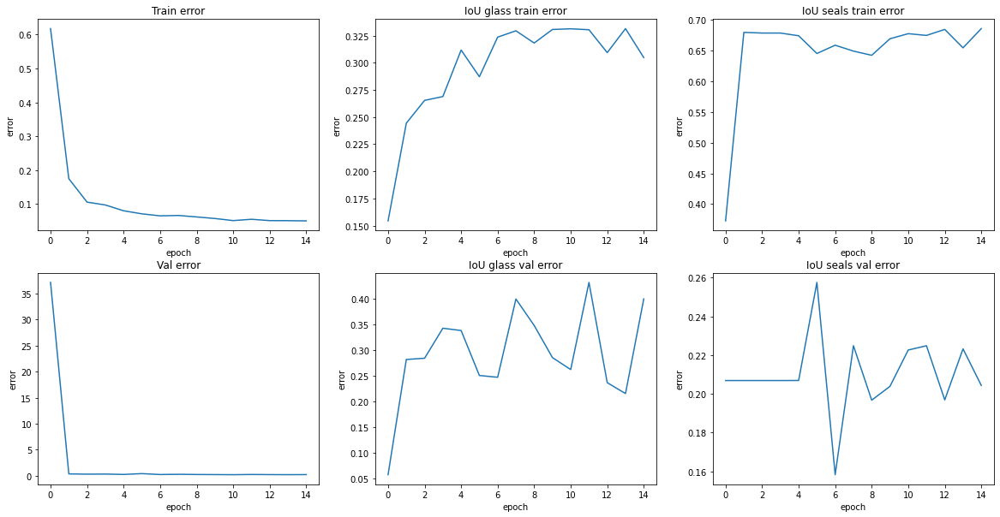

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU на двух различных масках с порогом в 0.5 увеличивается, чтобы получить лучше IoU нужно настраивать порог</h4>

#### Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/resnet101_best_model.pt")

In [ ]:
best_simple_model=smp.Unet(encoder_name="resnet101",encoder_depth=5,encoder_weights='imagenet',
                          decoder_channels=(256, 128, 64, 32, 16),decoder_use_batchnorm=True,
                          in_channels=1,classes=4,activation=None
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

#### Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

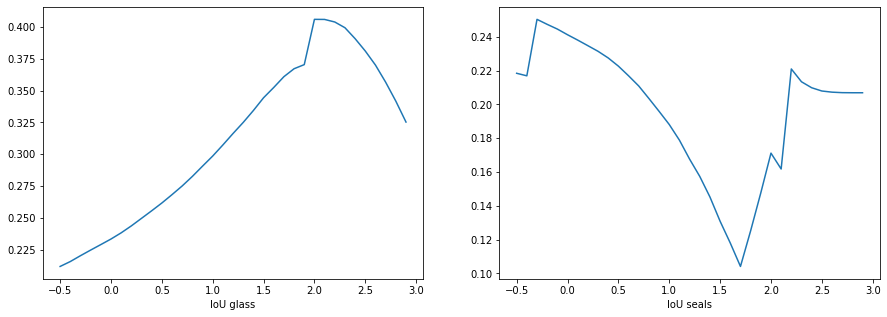

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

2.1999999999999993

<h4>Лучшие IoU c 2.2 порогом</h4>

#### Plot x-ray with mask

In [ ]:
k=10
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.2343])


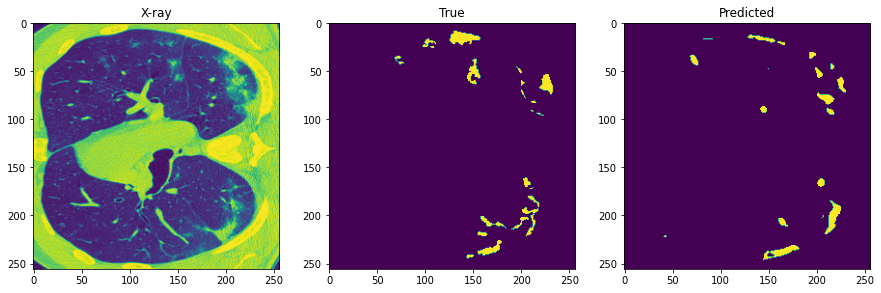

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.1393])


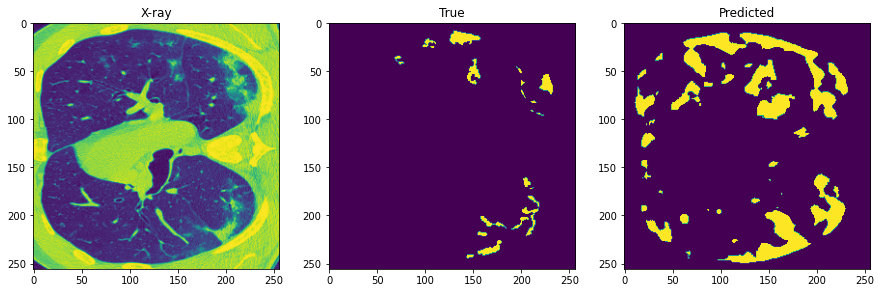

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат. В данном случае самый в среднем лучший порог лучше подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.3466])


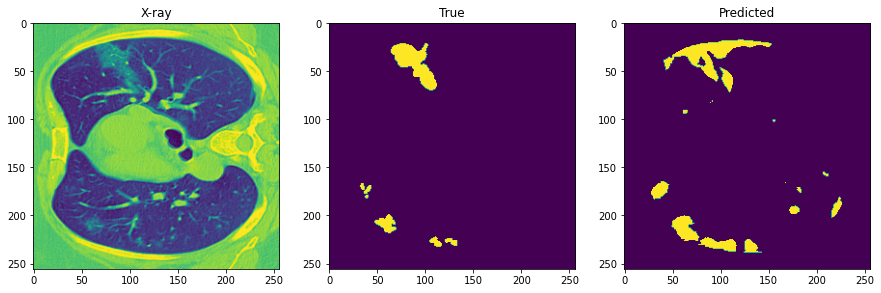

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.1204])


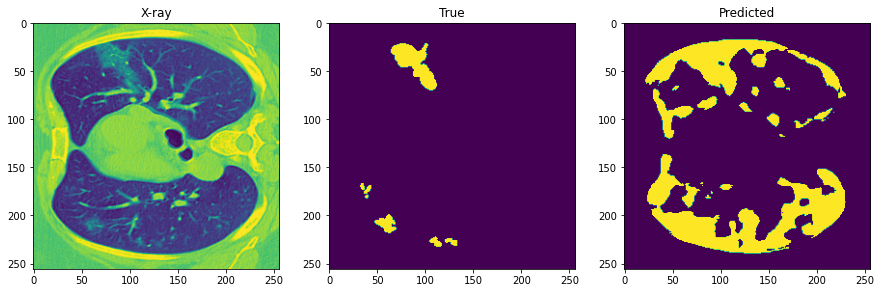

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами самый в среднем лучший порог лучше подобранного</h4> 

### Encoder resnet18

<h4>В качестве encoder выбрана resnet18 глубиной 5 и с весами imagenet. Это маленькая модель, она имеет 11M весов.</h4>

In [ ]:
pretrained_model=smp.Unet(encoder_name="resnet18",encoder_depth=5,encoder_weights='imagenet',
                          decoder_channels=(256, 128, 64, 32, 16),decoder_use_batchnorm=True,
                          in_channels=1,classes=4,activation=None
                          ).cuda()

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

#### Обучение

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(pretrained_model,train_loader,val_loader,epochs=15,threshold=0.5,network_name="resnet18")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 0.7932833472887675, IoU glass = 0.003819521357945632, IoU seals = 0.4646476971643849
Val error = 0.4604949653148651, IoU glass = 0.004159283358603716, IoU seals = 0.2068965584039688
Save best model with val error 0.4604949653148651


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.19829483355085056, IoU glass = 0.14571730067620123, IoU seals = 0.6255555639664332
Val error = 0.2965247631072998, IoU glass = 0.03448275849223137, IoU seals = 0.2068965584039688
Save best model with val error 0.2965247631072998


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.10447276954849562, IoU glass = 0.5440951218207677, IoU seals = 0.6822222312291463
Val error = 0.2679242193698883, IoU glass = 0.26242825388908386, IoU seals = 0.2068965584039688
Save best model with val error 0.2679242193698883


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.08785357686380545, IoU glass = 0.5614026933908463, IoU seals = 0.6833333373069763
Val error = 0.44845497608184814, IoU glass = 0.3249024450778961, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.44845497608184814


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.08438575640320778, IoU glass = 0.5528886169195175, IoU seals = 0.6833333373069763
Val error = 0.22025185823440552, IoU glass = 0.37873339653015137, IoU seals = 0.2068965584039688
Save best model with val error 0.22025185823440552


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.07906503118574619, IoU glass = 0.5382627030213674, IoU seals = 0.68444444835186
Val error = 0.24545393884181976, IoU glass = 0.2886747717857361, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.24545393884181976


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.06882859865824381, IoU glass = 0.5616725862026215, IoU seals = 0.6833333383003871
Val error = 0.21208599209785461, IoU glass = 0.4114844501018524, IoU seals = 0.2068965584039688
Save best model with val error 0.21208599209785461


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.05982917733490467, IoU glass = 0.5875301589568456, IoU seals = 0.6822222232818603
Val error = 0.2015102207660675, IoU glass = 0.4225798547267914, IoU seals = 0.2068965584039688
Save best model with val error 0.2015102207660675


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.055586247021953264, IoU glass = 0.5913077096144358, IoU seals = 0.6641856531302134
Val error = 0.18814034759998322, IoU glass = 0.4281603693962097, IoU seals = 0.1507706493139267
Save best model with val error 0.18814034759998322


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.05611898663143317, IoU glass = 0.5498743315537771, IoU seals = 0.6844658931096395
Val error = 0.16908307373523712, IoU glass = 0.3908681273460388, IoU seals = 0.12832556664943695
Save best model with val error 0.16908307373523712


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.05209458035727342, IoU glass = 0.5813078939914703, IoU seals = 0.7219632506370545
Val error = 0.1808028221130371, IoU glass = 0.29625755548477173, IoU seals = 0.1765909194946289
Don't save model. Val error is 0.1808028221130371


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.048450725401441255, IoU glass = 0.5691141734520594, IoU seals = 0.7273200035095215
Val error = 0.1850835531949997, IoU glass = 0.4529052674770355, IoU seals = 0.2060089260339737
Don't save model. Val error is 0.1850835531949997


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.0492596390346686, IoU glass = 0.5531667610009511, IoU seals = 0.7207682967185974
Val error = 0.16113775968551636, IoU glass = 0.4241529703140259, IoU seals = 0.21296468377113342
Save best model with val error 0.16113775968551636


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.046761681946615376, IoU glass = 0.5471286465724309, IoU seals = 0.718575797478358
Val error = 0.19284625351428986, IoU glass = 0.4652177691459656, IoU seals = 0.1781352162361145
Don't save model. Val error is 0.19284625351428986


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.04567217131455739, IoU glass = 0.5753456622362136, IoU seals = 0.7619649211565653
Val error = 0.18598328530788422, IoU glass = 0.4438207745552063, IoU seals = 0.11845307052135468
Don't save model. Val error is 0.18598328530788422


#### Результаты модели

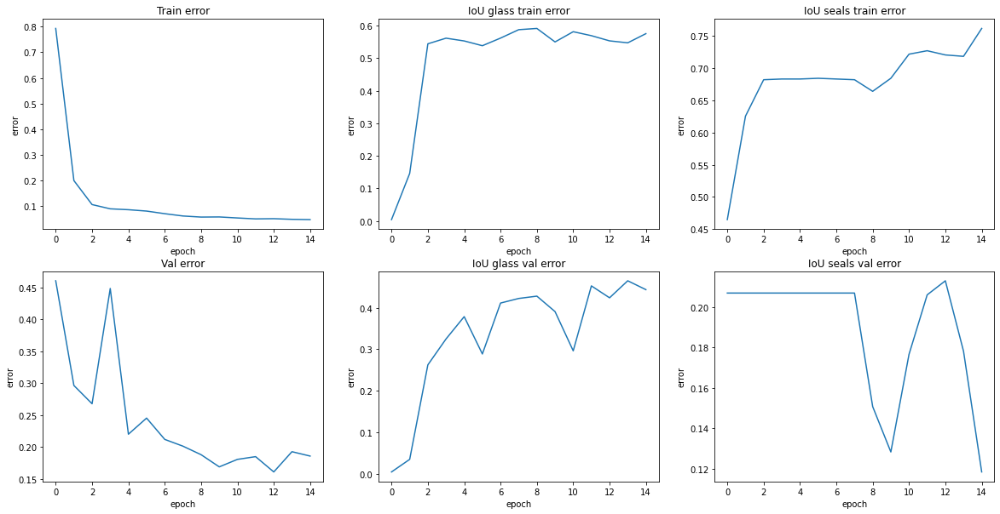

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals увеличивается только train, val себя ведет непонятно.</h4>

#### Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/resnet18_best_model.pt")

In [ ]:
best_simple_model=smp.Unet(encoder_name="resnet18",encoder_depth=5,encoder_weights='imagenet',
                          decoder_channels=(256, 128, 64, 32, 16),decoder_use_batchnorm=True,
                          in_channels=1,classes=4,activation=None
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

#### Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

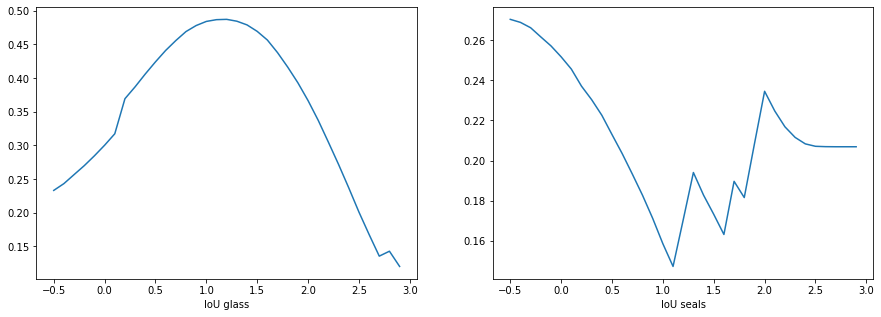

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

1.2999999999999996

<h4>Лучшие IoU c 1.3 порогом</h4>

#### Plot x-ray with mask

In [ ]:
k=10
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.1308])


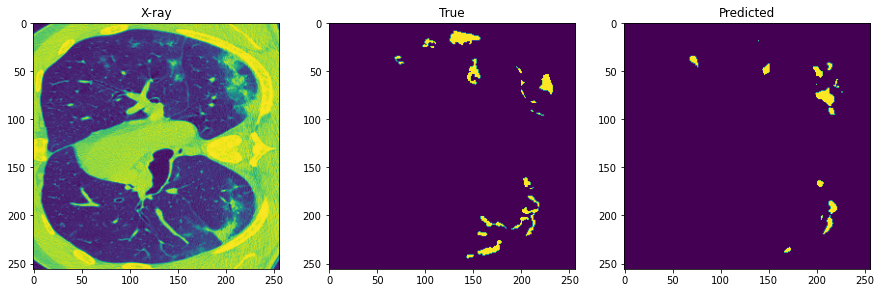

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.2591])


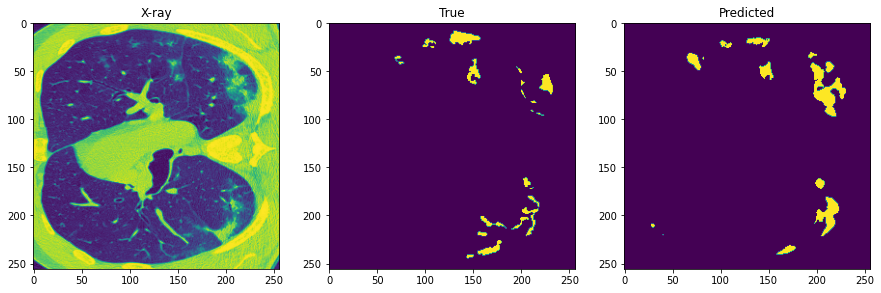

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог хуже подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.6308])


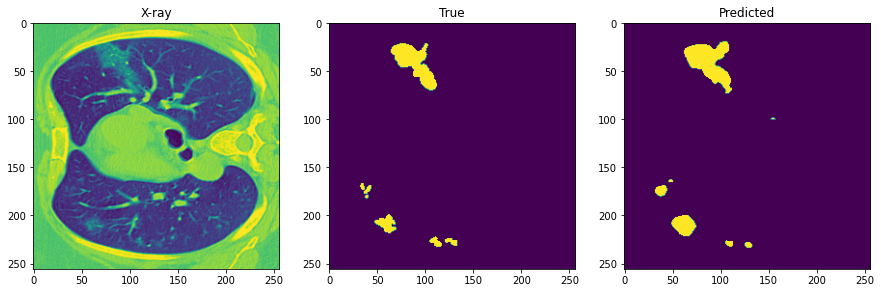

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.4670])


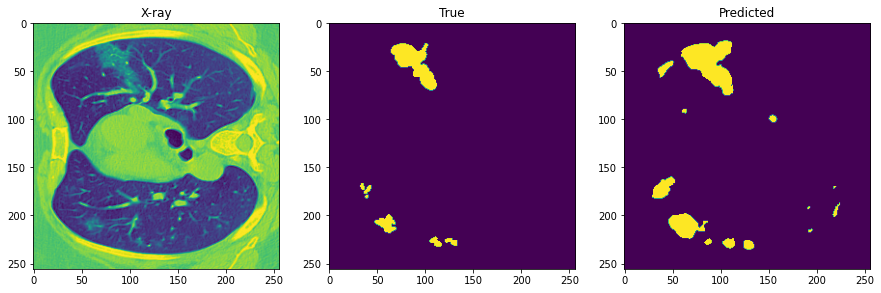

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>А здесь наоборот. На одних и тех же данных но с разными порогами самый в среднем лучший порог лучше подобранного</h4> 

## PAN

### Architecture

<h4>Network Architecture
</h4>

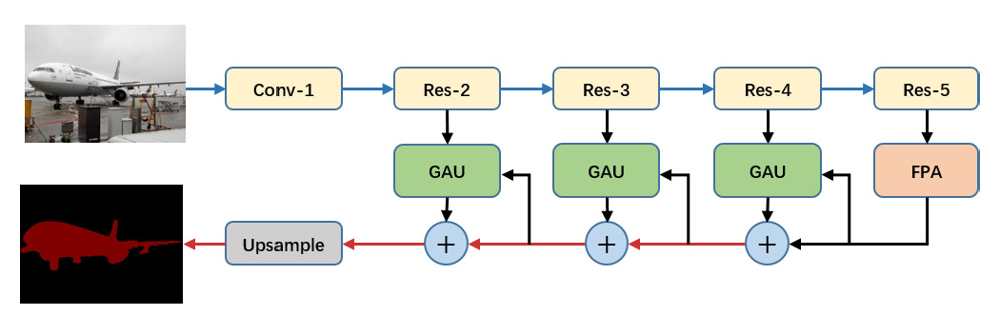

 <h4>Feature Pyramid Attention (FPA) Module</h4>

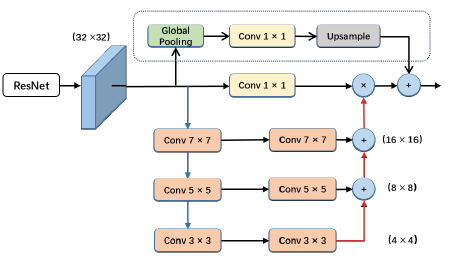

<h4>Feature Pyramid Attention (FPA) представлен для создания пространственной пирамидальной структуры внимания на высокоуровневых выходных данных и объединения global pooling для изучения лучшего представления функций.</h4>

<h4>Global Attention Upsample (GAU) Module</h4>


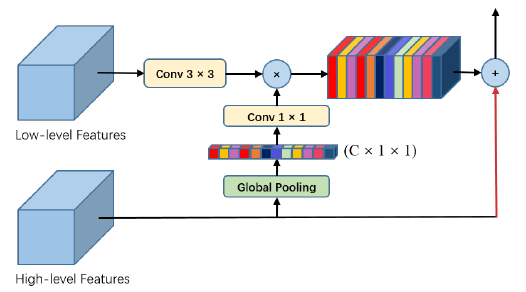

<h4>Модуль Global Attention Upsample (GAU) представлен на каждом уровне декодера, чтобы предоставить глобальный контекст в качестве руководства по низкоуровневым функциям для выбора деталей локализации категории.</h4>

### Создание и обучение модели

<h4>ImageNet Pretrained ResNet-101, with dilated convolution, is used as baseline</h4>

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

34143

In [ ]:
pretrained_model=smp.PAN(encoder_name="resnet101",encoder_weights='imagenet',
                          decoder_channels=32,in_channels=1,classes=4,activation=None
                          ).cuda()

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(pretrained_model,train_loader,val_loader,epochs=15,threshold=0.5,network_name="PANresnet101")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 0.42294228449463844, IoU glass = 0.28634804038641354, IoU seals = 0.5339232293074019
Val error = 0.7395221590995789, IoU glass = 0.10079210251569748, IoU seals = 0.2068965584039688
Save best model with val error 0.7395221590995789


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.10071673517425855, IoU glass = 0.5232791095972061, IoU seals = 0.6772489468256633
Val error = 0.21895742416381836, IoU glass = 0.21761029958724976, IoU seals = 0.2091825306415558
Save best model with val error 0.21895742416381836


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.08015949167311191, IoU glass = 0.5385879357655843, IoU seals = 0.6773461639881134
Val error = 0.1973416954278946, IoU glass = 0.3007858991622925, IoU seals = 0.2295534461736679
Save best model with val error 0.1973416954278946


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.0710392860074838, IoU glass = 0.5533307174841563, IoU seals = 0.6993469059467315
Val error = 0.19241711497306824, IoU glass = 0.35136717557907104, IoU seals = 0.26333677768707275
Save best model with val error 0.19241711497306824


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.0649986798564593, IoU glass = 0.5248055259386698, IoU seals = 0.7195878863334656
Val error = 0.16787613928318024, IoU glass = 0.3183448314666748, IoU seals = 0.2601361572742462
Save best model with val error 0.16787613928318024


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.059141214067737265, IoU glass = 0.5420554051796596, IoU seals = 0.7244596858819325
Val error = 0.1565188765525818, IoU glass = 0.3600480854511261, IoU seals = 0.20054492354393005
Save best model with val error 0.1565188765525818


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.05496915342907111, IoU glass = 0.5708258767922719, IoU seals = 0.7429854234059652
Val error = 0.16734692454338074, IoU glass = 0.370173841714859, IoU seals = 0.23857666552066803
Don't save model. Val error is 0.16734692454338074


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.0530334943284591, IoU glass = 0.5650356898705164, IoU seals = 0.7522910396258037
Val error = 0.1849132776260376, IoU glass = 0.37320584058761597, IoU seals = 0.139970600605011
Don't save model. Val error is 0.1849132776260376


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.05478068565328916, IoU glass = 0.5403144598007202, IoU seals = 0.7520085076491038
Val error = 0.200389102101326, IoU glass = 0.37265342473983765, IoU seals = 0.13974837958812714
Don't save model. Val error is 0.200389102101326


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.05058502604564031, IoU glass = 0.5553342153628668, IoU seals = 0.7497592508792877
Val error = 0.15569446980953217, IoU glass = 0.32085534930229187, IoU seals = 0.16876478493213654
Save best model with val error 0.15569446980953217


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.04729379639029503, IoU glass = 0.5498749941587449, IoU seals = 0.777148832877477
Val error = 0.17292936146259308, IoU glass = 0.3820498287677765, IoU seals = 0.15225312113761902
Don't save model. Val error is 0.17292936146259308


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.044596791205306845, IoU glass = 0.5618387142817179, IoU seals = 0.7748855471611023
Val error = 0.15283288061618805, IoU glass = 0.4007815718650818, IoU seals = 0.23716862499713898
Save best model with val error 0.15283288061618805


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.04346153785785039, IoU glass = 0.545473724603653, IoU seals = 0.7733911991119384
Val error = 0.1605226844549179, IoU glass = 0.25770828127861023, IoU seals = 0.23757612705230713
Don't save model. Val error is 0.1605226844549179


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.04496670650939147, IoU glass = 0.5514904747406641, IoU seals = 0.7637757559617361
Val error = 0.17039607465267181, IoU glass = 0.27026042342185974, IoU seals = 0.18902423977851868
Don't save model. Val error is 0.17039607465267181


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.042877757859726744, IoU glass = 0.5586557254195214, IoU seals = 0.7706563194592794
Val error = 0.14061763882637024, IoU glass = 0.35417449474334717, IoU seals = 0.2647116482257843
Save best model with val error 0.14061763882637024


### Результаты модели

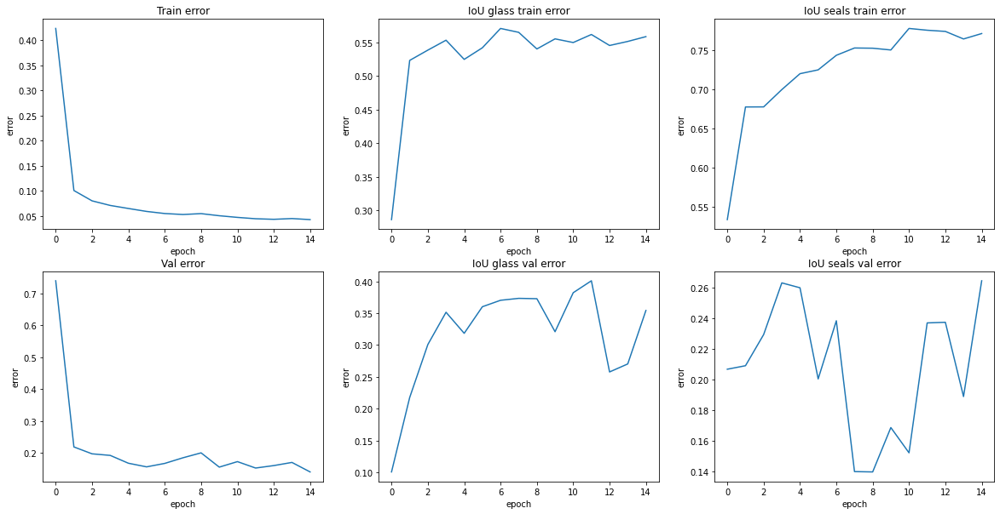

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals увеличивается только train, val колеблится</h4>

### Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/PANresnet101_best_model.pt")

In [ ]:
best_simple_model=smp.PAN(encoder_name="resnet101",encoder_weights='imagenet',
                          decoder_channels=32,in_channels=1,classes=4,activation=None
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

### Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

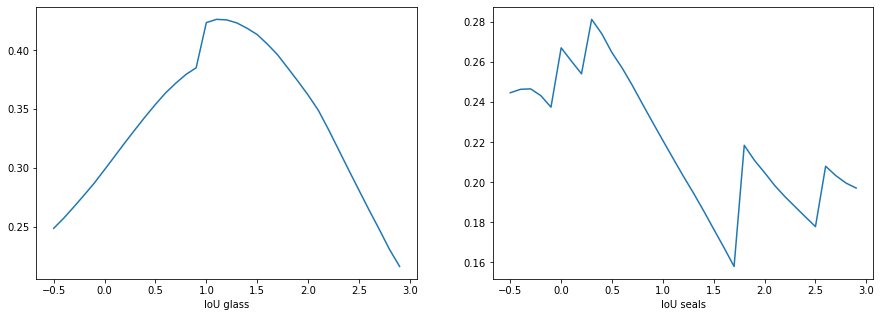

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

0.3999999999999998

<h4>Лучшие IoU c 1.3 порогом</h4>

### Plot x-ray with mask

In [ ]:
k=10
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.2162])


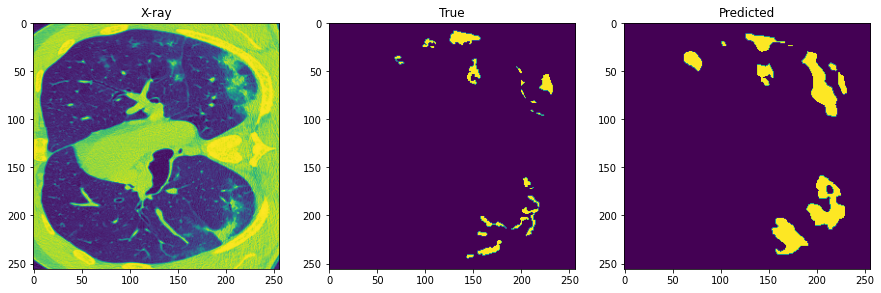

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.1932])


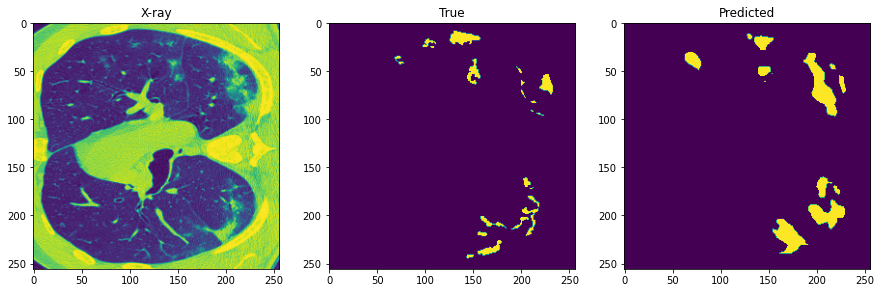

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами самый в среднем лучший порог лучше подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.3804])


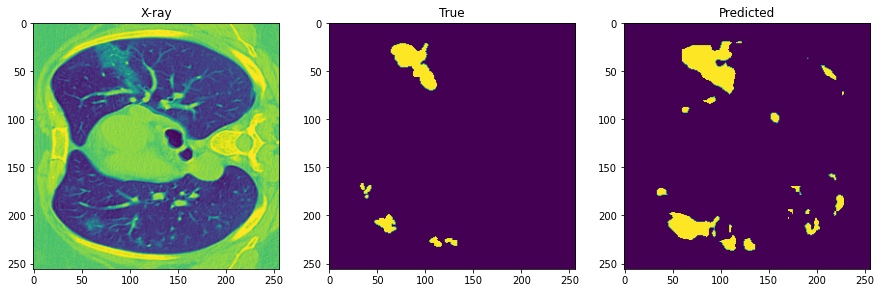

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.4779])


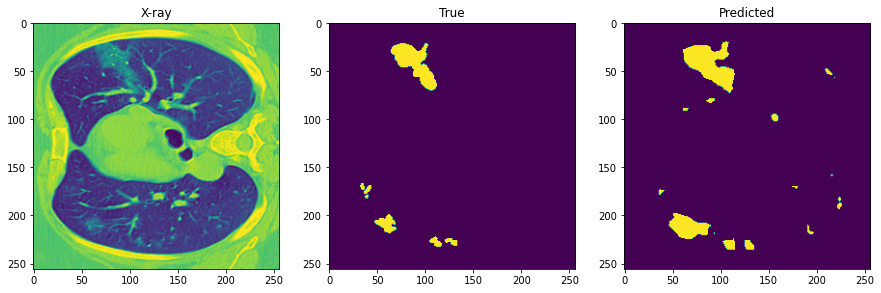

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат. В данном случае самый в среднем лучший порог хуже подобранного</h4> 

## LinkNet

### Architecture

<h4>Архитектура модели</h4>

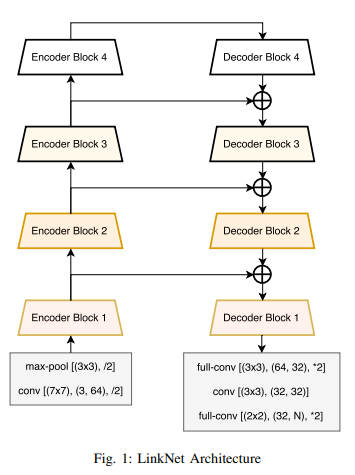

<h4>Архитектура encoder</h4>

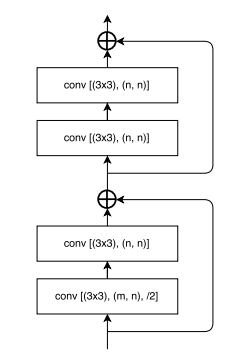

<h4>Архитектура decoder</h4>

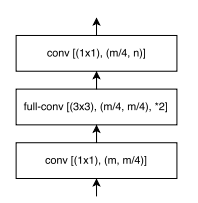

<h4>Как написано в статье, эта модель маленькая, имеет 11М параметров. Идея была такая, создать маленькую модель, которая по точности не уступала бы моделям с огромным числом параметров, и в будущем для использования ее в продакшене</h4>

### Создание и обучение модели

<h4>ImageNet Pretrained resnet34</h4>

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

32781

In [ ]:
pretrained_model=smp.Linknet(encoder_name="resnet34",encoder_weights='imagenet',
                          in_channels=1,classes=4,activation=None,
                          decoder_use_batchnorm=True
                          ).cuda()

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(pretrained_model,train_loader,val_loader,epochs=25,threshold=0.5,network_name="Linknetresnet34")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 0.6004761452476184, IoU glass = 0.0788986012339592, IoU seals = 0.04659186797216534
Val error = 0.6119393110275269, IoU glass = 0.03470173850655556, IoU seals = 0.06897802650928497
Save best model with val error 0.6119393110275269


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.22198982834815978, IoU glass = 0.2218087909122308, IoU seals = 0.4112264633178711
Val error = 0.3332942724227905, IoU glass = 0.036820799112319946, IoU seals = 0.2068965584039688
Save best model with val error 0.3332942724227905


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.16680362845460575, IoU glass = 0.21493919640779496, IoU seals = 0.6589091221491495
Val error = 0.2903258800506592, IoU glass = 0.1269315779209137, IoU seals = 0.10398994386196136
Save best model with val error 0.2903258800506592


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.12820965001980464, IoU glass = 0.26904874593019484, IoU seals = 0.6178027222553889
Val error = 0.24918752908706665, IoU glass = 0.16786223649978638, IoU seals = 0.20697222650051117
Save best model with val error 0.24918752908706665


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.10606153681874275, IoU glass = 0.4103739053010941, IoU seals = 0.6522617946068446
Val error = 0.23165494203567505, IoU glass = 0.26046568155288696, IoU seals = 0.2068965584039688
Save best model with val error 0.23165494203567505


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.09088835294047991, IoU glass = 0.4913971503575643, IoU seals = 0.6822222232818603
Val error = 0.21320560574531555, IoU glass = 0.2897435128688812, IoU seals = 0.2068965584039688
Save best model with val error 0.21320560574531555


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.08352529170612494, IoU glass = 0.46591348151365913, IoU seals = 0.6800013422966004
Val error = 0.24814072251319885, IoU glass = 0.28048932552337646, IoU seals = 0.17241379618644714
Don't save model. Val error is 0.24814072251319885


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.0802182407428821, IoU glass = 0.4843722924590111, IoU seals = 0.6811123629411061
Val error = 0.35581299662590027, IoU glass = 0.2311730533838272, IoU seals = 0.10346352308988571
Don't save model. Val error is 0.35581299662590027


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.0742544587701559, IoU glass = 0.501452965537707, IoU seals = 0.6811176240444183
Val error = 0.18391242623329163, IoU glass = 0.36525896191596985, IoU seals = 0.2070867121219635
Save best model with val error 0.18391242623329163


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.06604570671916007, IoU glass = 0.5049385666847229, IoU seals = 0.6800071487824122
Val error = 0.20492105185985565, IoU glass = 0.3654342591762543, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.20492105185985565


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.0682115559776624, IoU glass = 0.5064410140117009, IoU seals = 0.681116807460785
Val error = 0.20701585710048676, IoU glass = 0.3398474454879761, IoU seals = 0.20701004564762115
Don't save model. Val error is 0.20701585710048676


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.06283043598135313, IoU glass = 0.5057364389300346, IoU seals = 0.6744827131430308
Val error = 0.18249262869358063, IoU glass = 0.29811447858810425, IoU seals = 0.20712201297283173
Save best model with val error 0.18249262869358063


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.05886849761009216, IoU glass = 0.5000865171353023, IoU seals = 0.6561492244402568
Val error = 0.19297684729099274, IoU glass = 0.4157170057296753, IoU seals = 0.17440177500247955
Don't save model. Val error is 0.19297684729099274


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.0613118901848793, IoU glass = 0.5015756497780482, IoU seals = 0.6518558869759242
Val error = 0.2385864406824112, IoU glass = 0.33326685428619385, IoU seals = 0.1747671514749527
Don't save model. Val error is 0.2385864406824112


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.057468206311265625, IoU glass = 0.4711943566799164, IoU seals = 0.6508620828390121
Val error = 0.20449824631214142, IoU glass = 0.4062398374080658, IoU seals = 0.19000765681266785
Don't save model. Val error is 0.20449824631214142


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 15
Train error = 0.05486050893863042, IoU glass = 0.48155726740757626, IoU seals = 0.632187561194102
Val error = 0.2032184600830078, IoU glass = 0.4187909960746765, IoU seals = 0.17216283082962036
Don't save model. Val error is 0.2032184600830078


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 16
Train error = 0.05456096902489662, IoU glass = 0.48468739291032154, IoU seals = 0.656699409087499
Val error = 0.28521648049354553, IoU glass = 0.25037774443626404, IoU seals = 0.0773671343922615
Don't save model. Val error is 0.28521648049354553


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 17
Train error = 0.06156963010629018, IoU glass = 0.4400515134135882, IoU seals = 0.6185913135608038
Val error = 0.1831173449754715, IoU glass = 0.3665848672389984, IoU seals = 0.22057554125785828
Don't save model. Val error is 0.1831173449754715


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 18
Train error = 0.05336679096023242, IoU glass = 0.44672005822261174, IoU seals = 0.6675594389438629
Val error = 0.19221502542495728, IoU glass = 0.4216758608818054, IoU seals = 0.15210075676441193
Don't save model. Val error is 0.19221502542495728


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 19
Train error = 0.052787737299998604, IoU glass = 0.4807009289662043, IoU seals = 0.6696034113566081
Val error = 0.21293620765209198, IoU glass = 0.27254536747932434, IoU seals = 0.1363816112279892
Don't save model. Val error is 0.21293620765209198


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 20
Train error = 0.056675404558579126, IoU glass = 0.4138037145137787, IoU seals = 0.661976796388626
Val error = 0.1824265569448471, IoU glass = 0.2842887341976166, IoU seals = 0.14866213500499725
Save best model with val error 0.1824265569448471


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 21
Train error = 0.05204694407681624, IoU glass = 0.4367132971684138, IoU seals = 0.677050401767095
Val error = 0.17647986114025116, IoU glass = 0.3757108449935913, IoU seals = 0.17103493213653564
Save best model with val error 0.17647986114025116


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 22
Train error = 0.0497539406021436, IoU glass = 0.47239049673080447, IoU seals = 0.6778643975655237
Val error = 0.16034914553165436, IoU glass = 0.34551331400871277, IoU seals = 0.18480616807937622
Save best model with val error 0.16034914553165436


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 23
Train error = 0.04783111531287432, IoU glass = 0.45755279759565987, IoU seals = 0.6892523129781087
Val error = 0.22612710297107697, IoU glass = 0.4383453130722046, IoU seals = 0.17473916709423065
Don't save model. Val error is 0.22612710297107697


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 24
Train error = 0.049850759903589885, IoU glass = 0.43251636773347857, IoU seals = 0.6966812868913015
Val error = 0.182419553399086, IoU glass = 0.4610545337200165, IoU seals = 0.1808144450187683
Don't save model. Val error is 0.182419553399086


### Результаты модели

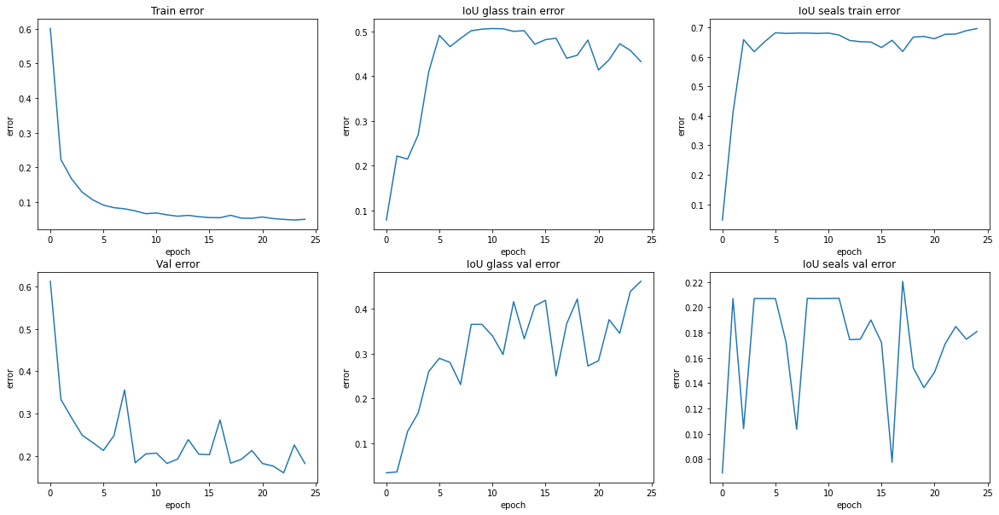

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals train и val увеличивается.</h4>

### Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/Linknetresnet34_best_model.pt")

In [ ]:
best_simple_model=smp.Linknet(encoder_name="resnet34",encoder_weights='imagenet',
                          in_channels=1,classes=4,activation=None,
                          decoder_use_batchnorm=True
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

### Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

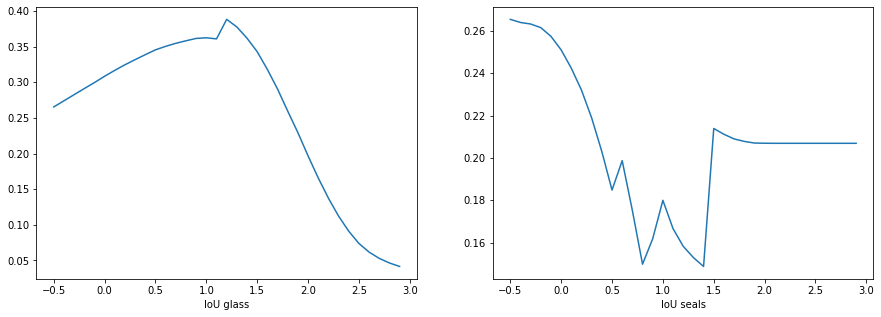

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

-1.1102230246251565e-16

<h4>Лучшие IoU c 0 порогом</h4>

### Plot x-ray with mask

In [ ]:
k=10
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.2097])


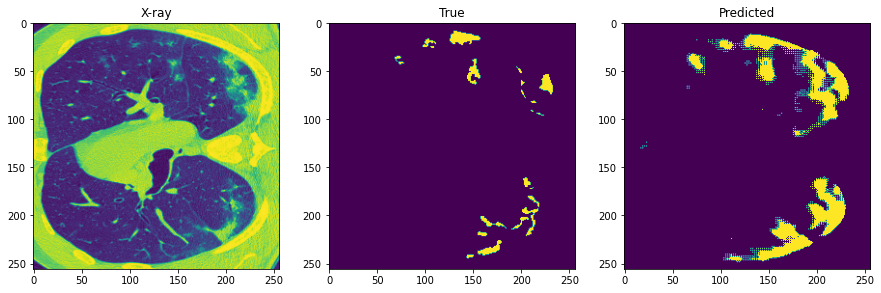

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.2703])


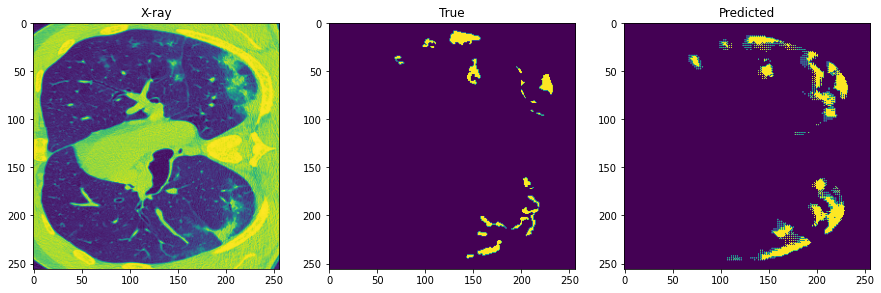

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог хуже подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.1321])


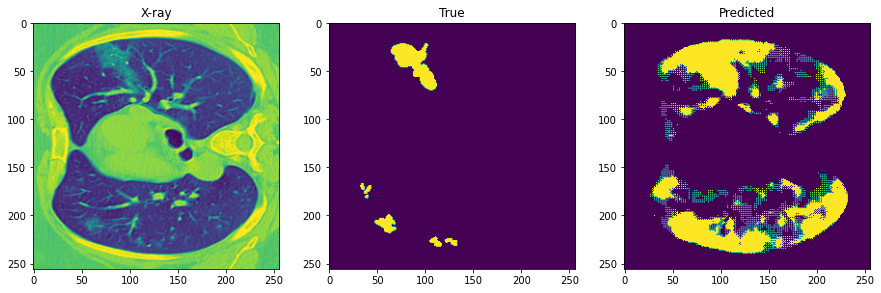

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.2293])


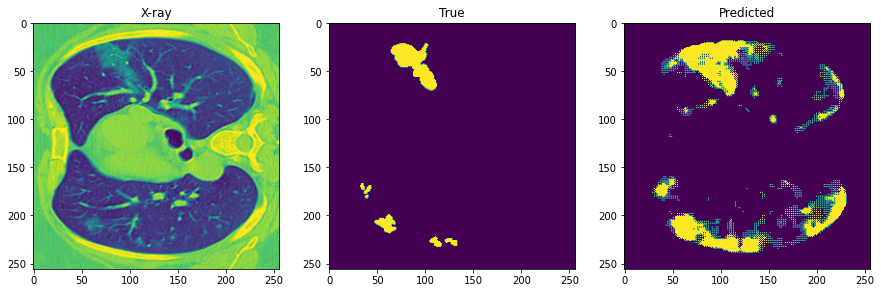

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог хуже подобранного</h4> 

<h4>Эта архитектура показала самые плохие результаты. В будущем она будет использоваться в качестве модели ученика при дистилляции.</h4>

## PSPNet

### Architecture

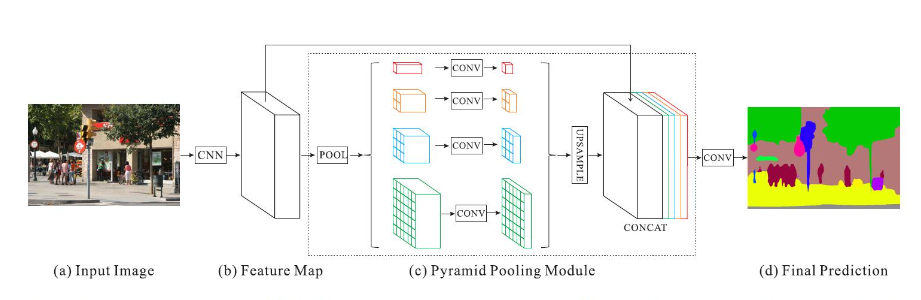

### Создание и обучение модели

<h4>ImageNet Pretrained resnet101</h4>

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

2782

In [ ]:
pretrained_model=smp.PSPNet(encoder_name="resnet101",encoder_weights='imagenet',
                          encoder_depth=3,psp_out_channels=512,
                          in_channels=1,classes=4,activation=None,
                          psp_use_batchnorm=True
                          ).cuda()

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_net(pretrained_model,train_loader,val_loader,epochs=15,threshold=0.5,network_name="PSPNetresnet101")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 0.23176187897721925, IoU glass = 0.5587600907621284, IoU seals = 0.6568572223186493
Val error = 0.33461299538612366, IoU glass = 0.12953482568264008, IoU seals = 0.2068965584039688
Save best model with val error 0.33461299538612366


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 0.09700511979560057, IoU glass = 0.5815508812665939, IoU seals = 0.6886073132356008
Val error = 0.23750239610671997, IoU glass = 0.2412923127412796, IoU seals = 0.2068965584039688
Save best model with val error 0.23750239610671997


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 0.0791494367023309, IoU glass = 0.5933714399735133, IoU seals = 0.6948634465535481
Val error = 0.21828490495681763, IoU glass = 0.18821017444133759, IoU seals = 0.11060546338558197
Save best model with val error 0.21828490495681763


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 0.07062535546720028, IoU glass = 0.5847900768121084, IoU seals = 0.7244628349939982
Val error = 0.19459056854248047, IoU glass = 0.2837316393852234, IoU seals = 0.13251206278800964
Save best model with val error 0.19459056854248047


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 0.06766245005031427, IoU glass = 0.5687464147806167, IoU seals = 0.7267840007940928
Val error = 0.20246151089668274, IoU glass = 0.28779351711273193, IoU seals = 0.14019808173179626
Don't save model. Val error is 0.20246151089668274


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 0.06653099370499452, IoU glass = 0.5884946331381797, IoU seals = 0.7156017998854319
Val error = 0.18305715918540955, IoU glass = 0.27847322821617126, IoU seals = 0.1589815765619278
Save best model with val error 0.18305715918540955


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 0.06336195146044095, IoU glass = 0.6165672640005747, IoU seals = 0.6890813807646433
Val error = 0.18824030458927155, IoU glass = 0.2834830582141876, IoU seals = 0.24791806936264038
Don't save model. Val error is 0.18824030458927155


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 0.06208678185939789, IoU glass = 0.6189195205767949, IoU seals = 0.7324022074540456
Val error = 0.17848451435565948, IoU glass = 0.2478564828634262, IoU seals = 0.06753762066364288
Save best model with val error 0.17848451435565948


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 0.056110550587375956, IoU glass = 0.6023932099342346, IoU seals = 0.7248954673608144
Val error = 0.17769579589366913, IoU glass = 0.27998191118240356, IoU seals = 0.1700790822505951
Save best model with val error 0.17769579589366913


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 0.05448237756888072, IoU glass = 0.6023101419210434, IoU seals = 0.7170157055060069
Val error = 0.2004164159297943, IoU glass = 0.2557682693004608, IoU seals = 0.1495651751756668
Don't save model. Val error is 0.2004164159297943


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 0.054283554355303444, IoU glass = 0.491705122590065, IoU seals = 0.7109302520751953
Val error = 0.19149398803710938, IoU glass = 0.3156108558177948, IoU seals = 0.13783317804336548
Don't save model. Val error is 0.19149398803710938


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 0.05159110464155674, IoU glass = 0.556705900033315, IoU seals = 0.7140034298102061
Val error = 0.16077905893325806, IoU glass = 0.2771831154823303, IoU seals = 0.16239623725414276
Save best model with val error 0.16077905893325806


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 0.049557177784542245, IoU glass = 0.5656369030475616, IoU seals = 0.7281707763671875
Val error = 0.16792993247509003, IoU glass = 0.33429521322250366, IoU seals = 0.13507848978042603
Don't save model. Val error is 0.16792993247509003


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 0.04866822448869546, IoU glass = 0.5300897548596064, IoU seals = 0.7345348099867502
Val error = 0.17131592333316803, IoU glass = 0.30453893542289734, IoU seals = 0.15977679193019867
Don't save model. Val error is 0.17131592333316803


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 0.04717732314020395, IoU glass = 0.5481138229370117, IoU seals = 0.7405535578727722
Val error = 0.15790650248527527, IoU glass = 0.30553823709487915, IoU seals = 0.20940770208835602
Save best model with val error 0.15790650248527527


### Результаты модели

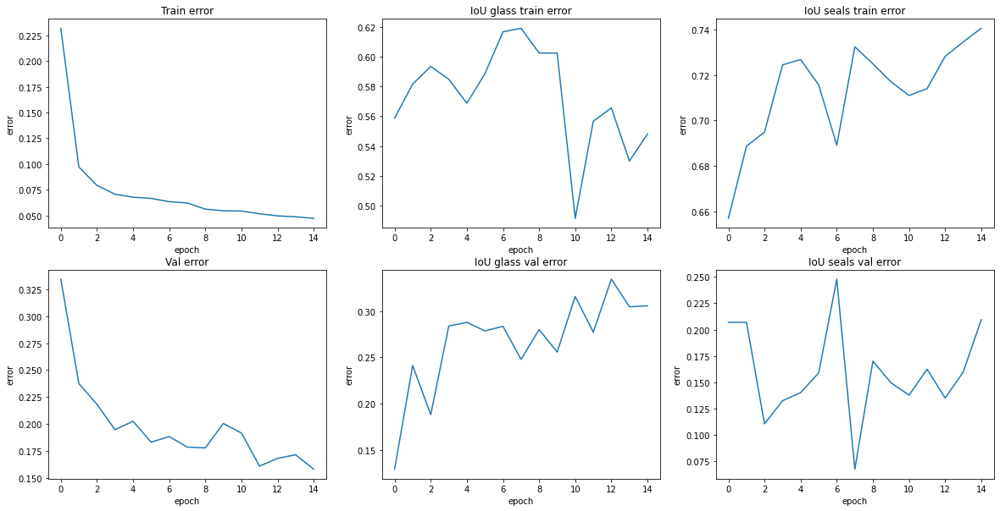

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals train и val увеличивается.</h4>

### Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/PSPNetresnet101_best_model.pt")

In [ ]:
best_simple_model=smp.PSPNet(encoder_name="resnet101",encoder_weights='imagenet',
                          encoder_depth=3,psp_out_channels=512,
                          in_channels=1,classes=4,activation=None,
                          psp_use_batchnorm=True
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

### Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

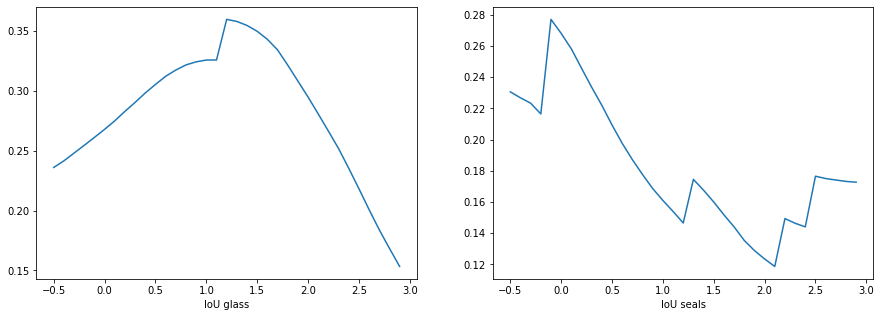

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

-0.10000000000000009

<h4>Лучшие IoU c 0 порогом</h4>

### Plot x-ray with mask

In [ ]:
k=10
j=1#output num
img_x,img_y=val_data[k]

IoU = tensor([0.5142])


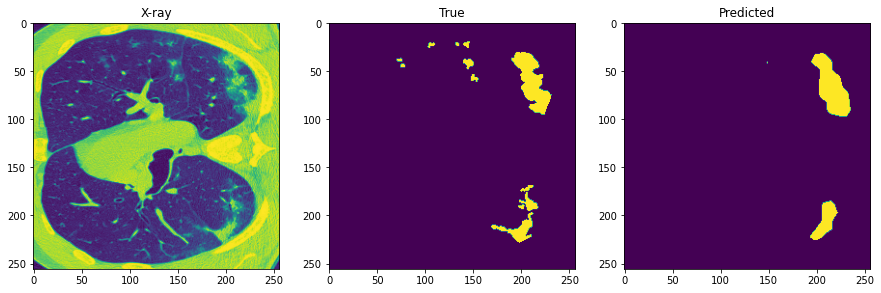

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.4413])


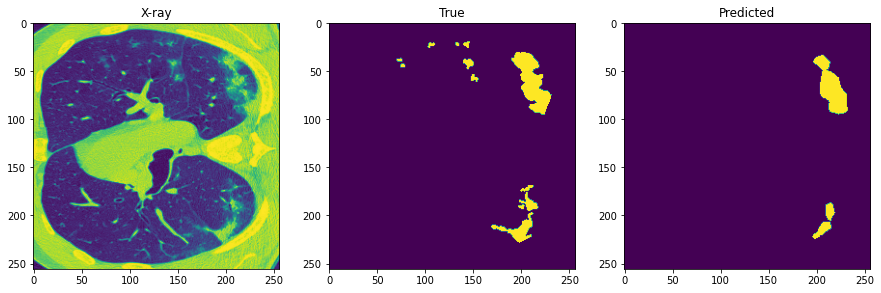

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог лучше подобранного</h4> 

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.0970])


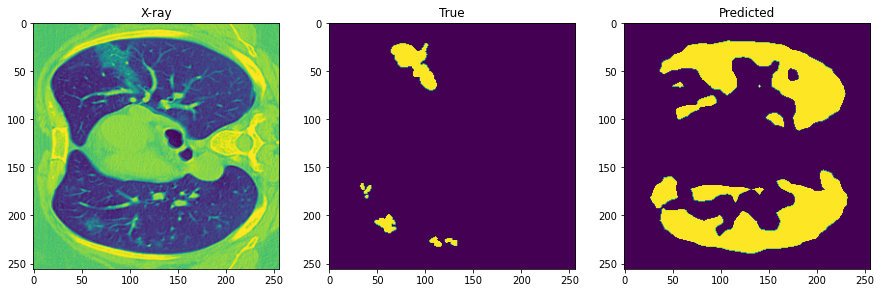

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.1556])


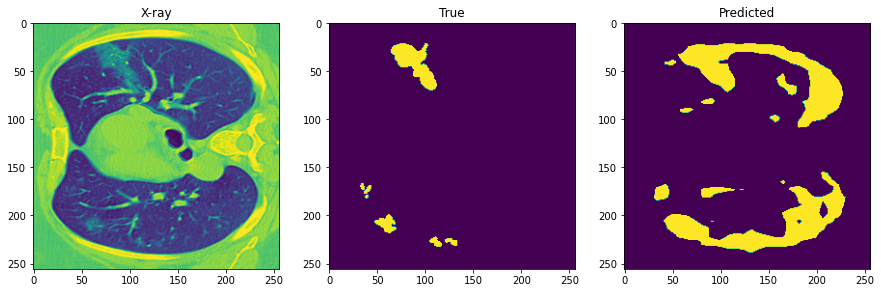

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог хуже подобранного</h4> 

## Вывод

<h4>Самые лучшие рузельтаты показала PANNet, она имеет самую низкую ошибку на train =0.04 и val = 0.14. Также она самая стабильная, то есть train val IoU вели себя адекватно, то есть с каждой эпохой train и val падали, а IoU рос. Второе и третье место занимают U net c resnet101 и resnet18. Самые худшие это LinkNet и PSPNet, возможно потому что они самые маленькие.</h4>

# Дистилляция модели

<h3>Суть:<p><h4>В реальности очень большие модели, например такие как Unet resnet101(в реальности намного больше) очень тяжело интегрировать в продакшен, одна из причин это огромный вес модели, число ее параметров. Поэтому придумали подход, благодаря которому маленькая модель может получить похожие результаты как и большая. В начале мы обучем большую модель на основе наших данных, потом тренируем маленькую модель на основе тех же данных в связке с этой большой сетью и интегрируем в продакшен маленькую модель. В качестве учителя будет выступать Unet resnet101, а в качестве ученика LinkNet resnet34, потому что она показала самые плохие результаты</h4></p></h3>

<h4>На практике результаты и в большой сети получились неочень хорошие, поэтому цель этой работы просто попрактиковаться с дистиляцией</h4>

<h4>Дистиляция была бы эффективна, если бы модель учитель была бы отличная </h4>

## Модель учителя

<h4>В качестве модели учителя возьмем Unet resnet101, так как она дала самые лучшие результаты на тестовых данных</h4>

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/resnet101_best_model.pt")

In [ ]:
teacher_model=smp.Unet(encoder_name="resnet101",encoder_depth=5,encoder_weights='imagenet',
                          decoder_channels=(256, 128, 64, 32, 16),decoder_use_batchnorm=True,
                          in_channels=1,classes=4,activation=None
                          ).cuda()
teacher_model.load_state_dict(state['state_dict'])
optimize_teacher_model=state['optimizer']

## Модель ученика

<h4>В качестве модели ученика возьму LinkNet resnet34</h4>

In [ ]:
student_model=smp.Linknet(encoder_name="resnet34",encoder_weights='imagenet',
                          in_channels=1,classes=4,activation=None,
                          decoder_use_batchnorm=True
                          ).cuda()

## Функции дистилляции

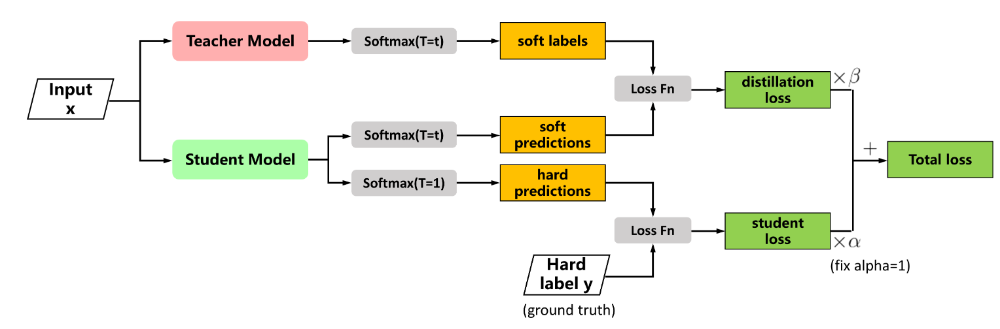

<h4>Как показанно на схеме функция стоимости состоит из суммы CE и дивергенции кульбака-лейблера умноженные на свои коэффициенты. В CE в качестве правидьных результатов hard label, то есть one-hot-vector, а в KL подается в качестве правильных результатов soft label модели учителя</h4>

<h4>Также softmax не обычный, а с сглаживающим параметром</h4>

In [ ]:
def loss_fn_kd(student_mask,true_mask,teacher_mask,alpha,T):
  ce_loss=torch.nn.CrossEntropyLoss()
  kl_loss = torch.nn.KLDivLoss(reduction="batchmean")
  log_softmax=torch.nn.LogSoftmax(dim=1)
  softmax=torch.nn.Softmax(dim=1)
  loss = ce_loss(student_mask,true_mask)*(1.-alpha) +  kl_loss(log_softmax(student_mask/T),softmax(teacher_mask/T))*(alpha*T*T)
  return loss

## Train distillation

In [ ]:
def train_kd(network,teacher_model,train_loader,val_loader,alpha,T,learning_rate=0.001,epochs=3,loaded_optimizer=None,threshold=1,network_name=None):
    optimizer=None
    if loaded_optimizer:
      optimizer=loaded_optimizer
    else:
      optimizer=torch.optim.AdamW(network.parameters(),lr=learning_rate,weight_decay=1e-4) # Optimizer
    
    loss_fn=torch.nn.CrossEntropyLoss() # Функция стоимости
    best_error=999
    iou_metric_glass=0
    iou_metric_seal=0
    errors=[] 
    errors_val=[]
    IoU_glass_1=[]
    IoU_seals_1=[]

    IoU_glass_test_1=[]
    IoU_seals_val_1=[]

    network.train() # переводим сеть в состояние обучения
    teacher_model.eval()
    for epoch in tqdm(range(epochs)):
        error=0
        iou_metric_glass=0
        iou_metric_seal=0
        for x_batch,y_batch in tqdm(train_loader):

            x_batch=x_batch.cuda() # передаем данные на куду
            y_batch=y_batch.cuda() 

            optimizer.zero_grad()
 
            y_pred=network(x_batch)
  
            with torch.no_grad():
                y_pred_teacher=teacher_model(x_batch)
            y_pred_teacher.requires_grad=False

            loss=loss_fn_kd(y_pred,y_batch,y_pred_teacher,alpha,T)

            error+=loss.item()

            loss.backward()

            optimizer.step()

            iou_metric_glass+=IoU(y_batch[:,0].detach(),y_pred[:,0].detach(),threshold).mean().item() # IoU на маске матовое стекло с порогом 1
            iou_metric_seal+=IoU(y_batch[:,1].detach(),y_pred[:,1].detach(),threshold).mean().item() # IoU на маске уплотнение с порогом 1

        errors.append(error/len(train_loader))
        IoU_glass_1.append(iou_metric_glass/len(train_loader))
        IoU_seals_1.append(iou_metric_seal/len(train_loader))
        print(f"Epoch = {epoch}")
        print(f"Train error = {error/len(train_loader)}, IoU glass = {iou_metric_glass/len(train_loader)}, IoU seals = {iou_metric_seal/len(train_loader)}")
        network.eval() #переводим сеть в состояние оценивание: исключаем слои, которые используются только train
        with torch.no_grad(): # временно устанавливает флаги requires_grad=False
            error_val=0
            iou_metric_glass_val=0
            iou_metric_seal_val=0
            for x_val,y_true in val_loader:
                x_val=x_val.cuda()    
                y_predicted=network(x_val.detach())

                y_predicted=y_predicted.cuda()
                y_true=y_true.cuda()

                loss_val=loss_fn(y_predicted.detach(),y_true.detach())
                error_val+=loss_val.item()

                iou_metric_glass_val+=IoU(y_true[:,0].detach(),y_predicted[:,0].detach(),threshold).mean().item() # IoU на маске матовое стекло с порогом 1
                iou_metric_seal_val+=IoU(y_true[:,1].detach(),y_predicted[:,1].detach(),threshold).mean().item() # IoU на маске уплотнение с порогом 1

            IoU_glass_test_1.append(iou_metric_glass_val/len(val_loader))
            IoU_seals_val_1.append(iou_metric_seal_val/len(val_loader))
            errors_val.append(error_val/len(val_loader))
            print(f"Val error = {error_val/len(val_loader)}, IoU glass = {iou_metric_glass_val/len(val_loader)}, IoU seals = {iou_metric_seal_val/len(val_loader)}")

            if best_error>error_val/len(val_loader):
                print(f'Save best model with val error {error_val/len(val_loader)}')
                state = {
                        'state_dict': network.state_dict(),
                        'optimizer' : optimizer.state_dict()}
                if network_name:
                    torch.save(state, f"/content/drive/MyDrive/ML_models/hw6/{network_name}_best_model.pt") #Сохраняем наилучшую модель
                else:
                    torch.save(state, f"/content/drive/MyDrive/ML_models/hw6/best_model.pt")
                best_error=error_val/len(val_loader)
            else:
                print(f"Don't save model. Val error is {error_val/len(val_loader)}")
            
        network.train()

    return network,errors,IoU_glass_1,IoU_seals_1,errors_val,IoU_glass_test_1,IoU_seals_val_1

## Обучение

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

105

In [ ]:
final_net,errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1=train_kd(student_model,teacher_model,train_loader,val_loader,0.2,1.5,epochs=25,threshold=0.5,network_name="DistillationLinkNetresnet101")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 0
Train error = 23749.817643229166, IoU glass = 0.003056155524048911, IoU seals = 0.0007144608174169783
Val error = 0.6295118927955627, IoU glass = 4.268199063517386e-06, IoU seals = 9.312624570156913e-06
Save best model with val error 0.6295118927955627


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 1
Train error = 10746.407633463541, IoU glass = 1.2755545942588445e-06, IoU seals = 7.62860817739198e-05
Val error = 0.41752997040748596, IoU glass = 4.224688307519209e-12, IoU seals = 5.730024440708803e-06
Save best model with val error 0.41752997040748596


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 2
Train error = 6047.836393229167, IoU glass = 0.14333333592233893, IoU seals = 0.0011212460340524354
Val error = 0.3784621059894562, IoU glass = 0.00016212680202443153, IoU seals = 0.07822013646364212
Save best model with val error 0.3784621059894562


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 3
Train error = 3759.965283203125, IoU glass = 0.5444451918204626, IoU seals = 0.13777778085769057
Val error = 0.38403379917144775, IoU glass = 0.06896551698446274, IoU seals = 0.13793103396892548
Don't save model. Val error is 0.38403379917144775


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 4
Train error = 2691.4211222330728, IoU glass = 0.5522242526213328, IoU seals = 0.6155555615822474
Val error = 0.3299601674079895, IoU glass = 0.06896551698446274, IoU seals = 0.2068965584039688
Save best model with val error 0.3299601674079895


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 5
Train error = 1816.997049967448, IoU glass = 0.5411111166079839, IoU seals = 0.6200000057617824
Val error = 0.2601838707923889, IoU glass = 0.06896551698446274, IoU seals = 0.2068965584039688
Save best model with val error 0.2601838707923889


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 6
Train error = 1383.19697265625, IoU glass = 0.556666671236356, IoU seals = 0.6266666769981384
Val error = 0.2787039577960968, IoU glass = 0.06896551698446274, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.2787039577960968


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 7
Train error = 1107.2595703125, IoU glass = 0.5218451301256816, IoU seals = 0.6177777846654257
Val error = 0.23066002130508423, IoU glass = 0.06898672878742218, IoU seals = 0.2068965584039688
Save best model with val error 0.23066002130508423


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 8
Train error = 839.1104573567708, IoU glass = 0.4833618144194285, IoU seals = 0.6311111191908518
Val error = 0.20211711525917053, IoU glass = 0.29334479570388794, IoU seals = 0.2068965584039688
Save best model with val error 0.20211711525917053


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 9
Train error = 706.9302144368489, IoU glass = 0.5207010462880135, IoU seals = 0.6266666690508524
Val error = 0.2149745672941208, IoU glass = 0.36764031648635864, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.2149745672941208


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 10
Train error = 578.9948862711589, IoU glass = 0.5421383837858836, IoU seals = 0.6288888961076736
Val error = 0.19187995791435242, IoU glass = 0.3392268419265747, IoU seals = 0.2068965584039688
Save best model with val error 0.19187995791435242


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 11
Train error = 482.1798105875651, IoU glass = 0.5394104768832525, IoU seals = 0.6477777858575186
Val error = 0.2348988652229309, IoU glass = 0.3574985861778259, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.2348988652229309


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 12
Train error = 455.7748168945312, IoU glass = 0.5374375800291697, IoU seals = 0.6533333400885264
Val error = 0.24200519919395447, IoU glass = 0.36212149262428284, IoU seals = 0.2068965584039688
Don't save model. Val error is 0.24200519919395447


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 13
Train error = 419.77049865722654, IoU glass = 0.5609439939260483, IoU seals = 0.6479384303092957
Val error = 0.20816026628017426, IoU glass = 0.3491569459438324, IoU seals = 0.2074914574623108
Don't save model. Val error is 0.20816026628017426


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 14
Train error = 466.36917165120445, IoU glass = 0.5316550850868225, IoU seals = 0.657657265663147
Val error = 0.26906341314315796, IoU glass = 0.27645033597946167, IoU seals = 0.17503051459789276
Don't save model. Val error is 0.26906341314315796


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 15
Train error = 564.6090474446614, IoU glass = 0.5118502537409465, IoU seals = 0.6233927130699157
Val error = 0.20082473754882812, IoU glass = 0.3969214856624603, IoU seals = 0.18876023590564728
Don't save model. Val error is 0.20082473754882812


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 16
Train error = 457.7380839029948, IoU glass = 0.5163986007372539, IoU seals = 0.6427581111590067
Val error = 0.2132047712802887, IoU glass = 0.2702833414077759, IoU seals = 0.13076254725456238
Don't save model. Val error is 0.2132047712802887


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 17
Train error = 374.3086771647135, IoU glass = 0.5151089539130529, IoU seals = 0.6485422482093175
Val error = 0.20729219913482666, IoU glass = 0.3403996229171753, IoU seals = 0.08393167704343796
Don't save model. Val error is 0.20729219913482666


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 18
Train error = 291.52378438313804, IoU glass = 0.5175460080305735, IoU seals = 0.6573655525843303
Val error = 0.1900635063648224, IoU glass = 0.4415430724620819, IoU seals = 0.09053818881511688
Save best model with val error 0.1900635063648224


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 19
Train error = 289.92403208414714, IoU glass = 0.5176959206660589, IoU seals = 0.6754122257232666
Val error = 0.18050603568553925, IoU glass = 0.3910878598690033, IoU seals = 0.10387381911277771
Save best model with val error 0.18050603568553925


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 20
Train error = 224.83993784586588, IoU glass = 0.5328824957211812, IoU seals = 0.6789065698782603
Val error = 0.19605551660060883, IoU glass = 0.4328528642654419, IoU seals = 0.09484966099262238
Don't save model. Val error is 0.19605551660060883


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 21
Train error = 212.25578918457032, IoU glass = 0.532849782705307, IoU seals = 0.690491783618927
Val error = 0.18021439015865326, IoU glass = 0.41921043395996094, IoU seals = 0.13099223375320435
Save best model with val error 0.18021439015865326


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 22
Train error = 214.72772674560548, IoU glass = 0.5332363744576772, IoU seals = 0.6955206831296284
Val error = 0.18227599561214447, IoU glass = 0.36000290513038635, IoU seals = 0.12690819799900055
Don't save model. Val error is 0.18227599561214447


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 23
Train error = 202.58297526041667, IoU glass = 0.527420332034429, IoU seals = 0.7044305920600891
Val error = 0.16833598911762238, IoU glass = 0.35962677001953125, IoU seals = 0.1586168110370636
Save best model with val error 0.16833598911762238


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch = 24
Train error = 188.20658187866212, IoU glass = 0.5167130023241043, IoU seals = 0.7040644804636638
Val error = 0.17184564471244812, IoU glass = 0.3497859835624695, IoU seals = 0.16388370096683502
Don't save model. Val error is 0.17184564471244812


## Результаты модели

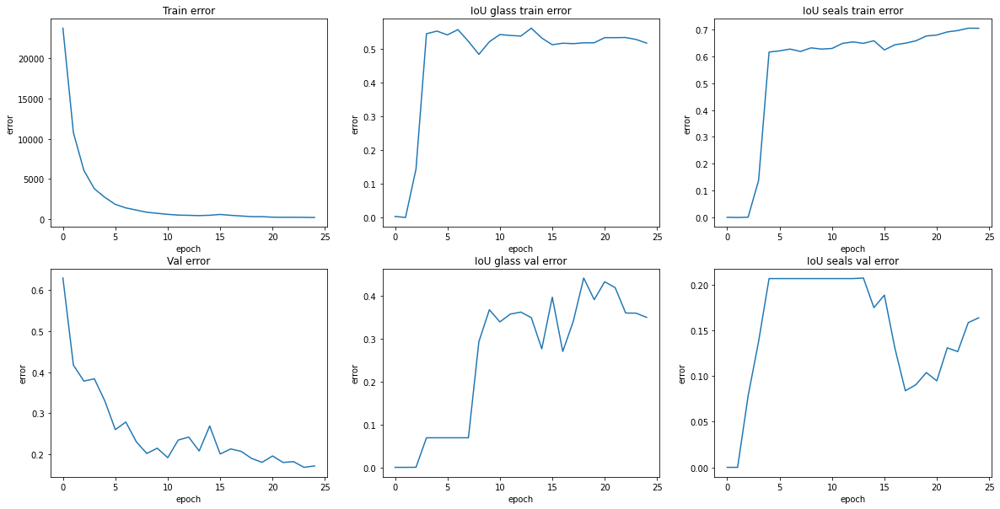

In [ ]:
plot_acc_error(errors,IoU_glass_error,IoU_seals_error,errors_val,IoU_glass_test_1,IoU_seals_val_1)

<h4>Как видно из результатов, ошибка на train и val падает, IoU glass на train и val увеличивается, на seals train и val увеличивается. Так же графики более плавнее чем у LinkNet без дистилляции. IoU glass train и val лучше чем у LinkNet без дистилляции</h4>

## Загрузка самой лучшей

In [ ]:
state=torch.load("/content/drive/MyDrive/ML_models/hw6/DistillationLinkNetresnet101_best_model.pt")

In [ ]:
best_simple_model=smp.Linknet(encoder_name="resnet34",encoder_weights='imagenet',
                          in_channels=1,classes=4,activation=None,
                          decoder_use_batchnorm=True
                          ).cuda()
best_simple_model.load_state_dict(state['state_dict'])
optimize_best_simple_model=state['optimizer']

## Выбор порога

In [ ]:
thresholds=np.arange(-0.5,3,0.1)

In [ ]:
IoU_glass_val,IoU_seals_val,best_threshold=config_threshold(best_simple_model,val_loader,thresholds)

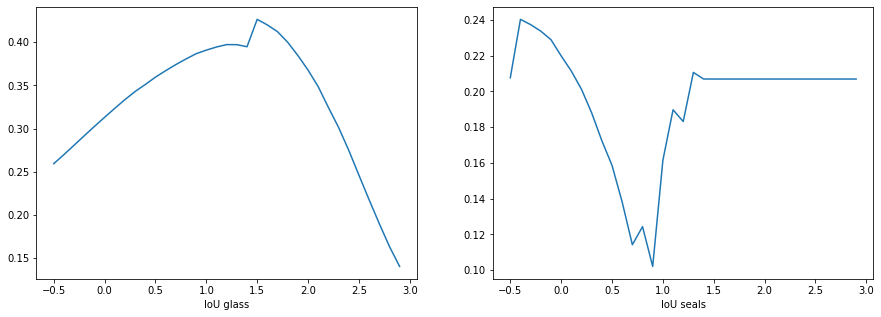

In [ ]:
plot_thresholds(IoU_glass_val,IoU_seals_val,thresholds)

In [ ]:
best_threshold

1.4999999999999996

<h4>Лучшие IoU c 1.5 порогом</h4>

## Plot x-ray with mask

In [ ]:
k=17
j=0#output num
img_x,img_y=val_data[k]

IoU = tensor([0.4582])


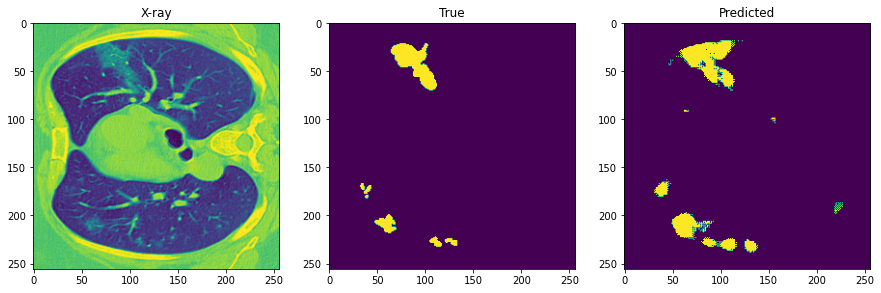

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=best_threshold)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=best_threshold)}")

IoU = tensor([0.3186])


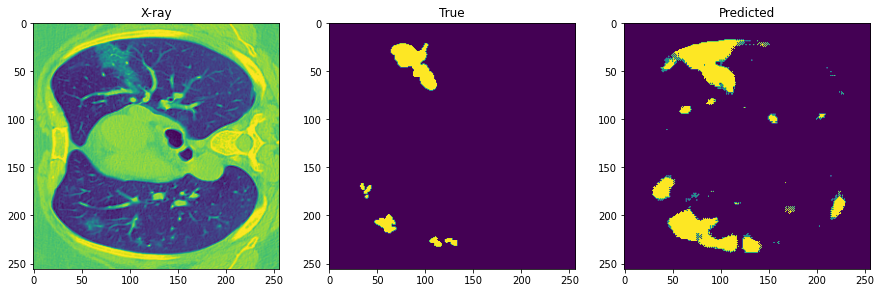

In [ ]:
pred_mask=predict_mask(best_simple_model,img_x)
plot_mask(img_x[0],img_y[j],pred_mask[0][j],threshold=0.7)
print(f"IoU = {IoU(img_y[j],pred_mask[0][j],threshold=0.7)}")

<h4>На одних и тех же данных но с разными порогами разный результат.  В данном случае самый в среднем лучший порог лучше подобранного. Так же IoU выше чем у LinkNet без дистилляции</h4> 

## Вывод

<h4>Не смотря на то, что модель учителя не идеальная, благодаря ей модель студент получила IoU выше чем та же модель но без учителя. Так же визуально на предсказаниях эта дистиллированная модель лучше </h4>